<a href="https://colab.research.google.com/github/davidjcox333/Man-vs-Machine/blob/master/GME_fits.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import the packages we'll be using and read in the data set

In [ ]:
# Packages we'll use
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import zipfile, io, os
import math
import time
import seaborn as sns
# from google.colab import files
# files.upload()
from google.colab import drive
drive.mount('/content/gdrive')
%cd './gdrive/My Drive/GME & MLB/Data_and_Fits'

Mounted at /content/gdrive
/content/gdrive/My Drive/GME & MLB/Data_and_Fits


# Make sure dataframe is ready for fitting

In [102]:
# Read in file
data_raw = pd.read_csv("all_pitches_08_19.csv").drop(['Unnamed: 0'], axis=1)
# data_raw = data_raw.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1)
data = data_raw.copy()
data[::300000] # Take a look at every 300,000 row of the df

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (44,88,89) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,description,spin_dir,spin_rate_deprecated,break_angle_deprecated,break_length_deprecated,zone,des,game_type,stand,p_throws,home_team,away_team,type,hit_location,bb_type,balls,strikes,game_year,pfx_x,pfx_z,plate_x,plate_z,on_3b,on_2b,on_1b,outs_when_up,inning,inning_topbot,hc_x,hc_y,tfs_deprecated,...,az,sz_top,sz_bot,hit_distance_sc,launch_speed,launch_angle,effective_speed,release_spin_rate,release_extension,game_pk,pitcher.1,fielder_2.1,fielder_3,fielder_4,fielder_5,fielder_6,fielder_7,fielder_8,fielder_9,release_pos_y,estimated_ba_using_speedangle,estimated_woba_using_speedangle,woba_value,woba_denom,babip_value,iso_value,launch_speed_angle,at_bat_number,pitch_number,pitch_name,home_score,away_score,bat_score,fld_score,post_away_score,post_home_score,post_bat_score,post_fld_score,if_fielding_alignment,of_fielding_alignment
0,FF,2019-09-29,94.9,-2.3738,5.1379,Ian Kennedy,570731,453178,field_out,hit_into_play,NaN,NaN,NaN,NaN,3.0,Jonathan Schoop pops out to second baseman Eri...,R,R,R,KC,MIN,X,4.0,popup,1,1,2019,-0.909700,1.197200,0.3906,3.1900,NaN,NaN,NaN,2,9,Top,134.20,170.51,NaN,...,-16.6055,3.5400,1.6800,NaN,80.0,69.0,95.087,2430.0,6.245,565782,453178,664926.0,656811.0,625510.0,596144.0,600858.0,643436.0,621433.0,641531.0,54.2545,0.002,0.000,0.0,1.0,0.0,0.0,3.0,67,3,4-Seam Fastball,4,4,4,4,4,4,4,4,Standard,Standard
300000,FF,6/12/2013,92.7,NaN,NaN,Ubaldo Jimenez,595777,434622,single,hit_into_play_no_out,NaN,NaN,NaN,NaN,5.0,Jurickson Profar singles on a line drive to ri...,R,L,R,TEX,CLE,X,9.0,line_drive,3,2,2013,-1.000000,1.200000,0.2300,2.6600,NaN,NaN,NaN,0,3,Bot,170.68,120.48,NaN,...,-19.0500,3.2500,1.5000,NaN,NaN,NaN,NaN,NaN,NaN,347723,434622,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9,NaN,1.0,0.0,NaN,25,6,4-Seam Fastball,1,3,1,3,3,1,1,3,NaN,NaN
600000,FF,8/5/2015,98.2,-2.2600,6.4000,Taijuan Walker,518934,592836,NaN,ball,NaN,NaN,NaN,NaN,11.0,NaN,R,R,R,COL,SEA,B,NaN,NaN,2,2,2015,-0.500000,0.900000,-1.0000,5.0600,NaN,NaN,NaN,2,6,Bot,NaN,NaN,NaN,...,-22.1420,3.7300,1.7400,NaN,NaN,NaN,98.800,2159.0,6.800,415263,592836,572287.0,444432.0,429664.0,572122.0,606466.0,429711.0,457706.0,443558.0,53.7400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52,5,4-Seam Fastball,3,3,3,3,3,3,3,3,Standard,Standard
900000,FF,2019-04-14,95.1,-2.4165,5.8449,Jacob Barnes,641355,606930,strikeout,called_strike,NaN,NaN,NaN,NaN,14.0,Cody Bellinger called out on strikes.,R,L,R,LAD,MIL,S,2.0,NaN,2,2,2019,-0.353100,1.198000,0.5948,1.4827,NaN,NaN,NaN,1,6,Bot,NaN,NaN,NaN,...,-14.9366,3.8740,1.7203,NaN,NaN,NaN,96.485,2332.0,6.791,565808,606930,518735.0,542583.0,519058.0,543768.0,606115.0,592325.0,456715.0,519346.0,53.7083,NaN,NaN,0.0,1.0,0.0,0.0,NaN,50,5,4-Seam Fastball,7,0,7,0,0,7,7,0,Infield shift,Standard
1200000,FF,2015-06-23,92.9,-0.6400,5.7700,Al Alburquerque,596019,456379,field_out,hit_into_play,NaN,NaN,NaN,NaN,1.0,Francisco Lindor lines out to center fielder A...,R,L,R,CLE,DET,X,8.0,line_drive,2,1,2015,-0.900000,1.500000,-0.7200,2.8500,570482.0,543401.0,NaN,2,7,Bot,113.87,93.28,NaN,...,-15.4010,3.3100,1.5300,279.0,101.5,13.0,91.100,2409.0,5.200,414715,456379,543510.0,408234.0,435079.0,592206.0,461865.0,493316.0,543238.0,434658.0,55.2400,0.733,0.764,0.0,1.0,0.0,0.0,4.0,62,4,4-Seam Fastball,1,7,1,7,7,1,1,7,Standard,Strategic
1500000,SL,7/24/2012,90.6,NaN,NaN,Clayton Kershaw,279577,477132,NaN,blocked_ball,NaN,NaN,NaN,NaN,60.0,NaN,R,R,L,STL,LAD,B,NaN,NaN,0,2,2012,-0.600000,0.900000,-1.0600,0.4400,501896.0,518614.0,425794.0,2,6,Bot,NaN,NaN,NaN,...,-23.7420,3.1800,1.4800,NaN,NaN,NaN,NaN,NaN,NaN,319183,477132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53,3,Slider,4,2,4,2,2,4,4,2,NaN,NaN
1800000,SL,8/28/2013,76.7,NaN,NaN,Darren Oliver,407489,119984,NaN,called_strike,NaN,NaN,NaN,NaN,29.0,NaN,R,L,L,TOR,NYY,S,NaN,NaN,0,1,2013,-1.200000,-0.200000,0.6300,2.5700,NaN,NaN,NaN,1,9,Top,NaN,NaN,NaN,...,-35.4640,3.6200,1.6200,NaN,NaN,NaN,NaN,NaN,NaN,348729,119984,Na

In [103]:
# Create a list of all the unique pitchers in the df
uniq_p = data.player_name.unique()
uniq_p = uniq_p.tolist()
print("Number of unique pitchers in the dataset:", len(uniq_p))
print("Number of total observations in the dataset:", len(data))

Number of unique pitchers in the dataset: 2374
Number of total observations in the dataset: 8467473


In [104]:
# Look at all the different pitch types in the dataframe
data['pitch_name'].unique()

array(['4-Seam Fastball', 'Cutter', 'Knuckle Curve', 'Sinker', 'Changeup',
       'Slider', '2-Seam Fastball', 'Curveball', nan, 'Split Finger',
       'Intentional Ball', 'Split-Finger', 'Pitch Out', 'Fastball',
       'Unknown', 'Forkball', 'Knuckleball', 'Eephus', 'Knuckle Ball',
       'Screwball'], dtype=object)

In [105]:
# Create lists of which pitches fall into which categories
hrd_strt = ['4-Seam Fastball', '2-Seam Fastball', 'Cutter']
hrd_brkng = ['Slider', 'Sinker', 'Split Finger', 'Screwball', 'Forkball']
sft_strt = ['Changeup', 'Knuckle Ball', 'Eephus']
sft_brkng = ['Curveball', 'Knuckle Curve']

In [106]:
# Look at all the different outcome events
data['description'].unique()

array(['hit_into_play', 'ball', 'called_strike', 'swinging_strike',
       'foul', 'foul_tip', 'swinging_strike_blocked',
       'hit_into_play_no_out', 'blocked_ball', 'hit_by_pitch',
       'hit_into_play_score', 'foul_bunt', 'missed_bunt', 'bunt_foul_tip',
       'intent_ball', 'pitchout', 'swinging_pitchout',
       'pitchout_hit_into_play_no_out', 'pitchout_hit_into_play',
       'pitchout_hit_into_play_score', 'foul_pitchout', 'unknown_strike'],
      dtype=object)

In [107]:
# Create list of all Strike and out categories to serve as reinforcers
s_o = ['hit_into_play', 'foul','swinging_strike', 'swinging_strike_blocked', \
       'called_strike','foul_bunt', 'foul_tip', 'missed_bunt','swinging_pitchout', \
       'foul_pitchout', 'bunt_foul_tip', 'unknown_strike']

# Fit the GME for each pitcher in the df using strikes and outs as assumed reinforcers

### Caution: This will run for a long time. Break into batches if possible. 

In [123]:
# Make sure data types are as we need them
data.game_year = data.game_year.astype(int)

# Identifiers
player = []
season = []

# Matching params at season level
VAC_strikes = []
bias_strikes = []
sens_strikes = []

# Count of each pitch type at the season level
hstrt_season = []
hbrk_season = []
sstrt_season = []
sbrk_season = []

# Pitch characteristics at season level
# Raw speed
corr_raw_spd_hstrt = []
corr_raw_spd_hbrk = []
corr_raw_spd_sstrt = []
corr_raw_spd_sbrk = []
# Speed difference from fastball
corr_diff_spd_hbrk = []
corr_diff_spd_sstrt = []
corr_diff_spd_sbrk = []
# Raw breaking distance
corr_raw_brk_hbrk_x = []
corr_raw_brk_sbrk_x = []
corr_raw_brk_hbrk_z = []
corr_raw_brk_sbrk_z = []
corr_raw_brk_hbrk_t = []
corr_raw_brk_sbrk_t = []
# Breaking difference from fastball
corr_diff_brk_hbrk_x = []
corr_diff_brk_sbrk_x = []
corr_diff_brk_hbrk_z = []
corr_diff_brk_sbrk_z = []
corr_diff_brk_hbrk_t = []
corr_diff_brk_sbrk_t = []

# Logging errors
player_errors = []
err_type = []

# Pull df for the target pitcher and break down by season
import warnings
warnings.filterwarnings("ignore")
for i in range(len(uniq_p)):
  try:
    # Lists to store things in
    game_number = []
    year = []
    hard_straight_count = []
    hard_breaking_count = []
    soft_straight_count = []
    soft_breaking_count = []
    hard_straight_s_o = []
    hard_breaking_s_o = []
    soft_straight_s_o = []
    soft_breaking_s_o = []
    hard_straight_spd = []
    hard_breaking_spd = []
    soft_straight_spd = []
    soft_breaking_spd = []
    hard_straight_x = []
    hard_breaking_x = []
    soft_straight_x = []
    soft_breaking_x = []
    hard_straight_z = []
    hard_breaking_z = []
    soft_straight_z = []
    soft_breaking_z = []
    hard_straight_t = []
    hard_breaking_t = []
    soft_straight_t = []
    soft_breaking_t = []

    df = data[data['player_name']==uniq_p[i]]

    for j in [2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]:
      try:
        df_year = df[df['game_year']==j]
        g_uniq = df_year['game_date'].unique()
        if len(g_uniq) < 5:
          continue
        else:
          gnum = 1
          for k in g_uniq:
            game_data = df_year[df_year['game_date']==k]

            if len(game_data) < 5:
              pass
            else:
              # Create dfs for each pitch type
              hard_straight = game_data.loc[game_data.pitch_name.isin(hrd_strt)]
              hard_breaking = game_data.loc[game_data.pitch_name.isin(hrd_brkng)]
              soft_straight = game_data.loc[game_data.pitch_name.isin(sft_strt)]
              soft_breaking = game_data.loc[game_data.pitch_name.isin(sft_brkng)]
              
              # Get the count of each pitch type per game
              hstrt = len(hard_straight)
              hbrk = len(hard_breaking)
              sstrt = len(soft_straight)
              sbrk = len(soft_breaking)

              # Get the count of strikes/outs that followed each pitch type per game
              hstrt_strike = len(hard_straight.loc[hard_straight.description.isin(s_o)])
              hbrk_strike = len(hard_breaking.loc[hard_breaking.description.isin(s_o)])
              sstrt_strike = len(soft_straight.loc[soft_straight.description.isin(s_o)])
              sbrk_strike = len(soft_breaking.loc[soft_breaking.description.isin(s_o)])

              # Get the average speed for each pitch type per game
              hstrt_spd = hard_straight['release_speed'].mean()
              hbrk_spd = hard_breaking['release_speed'].mean()
              sstrt_spd = soft_straight['release_speed'].mean()
              sbrk_spd = soft_breaking['release_speed'].mean()

              # Get the average x break for each pitch type per game
              hstrt_x = hard_straight['pfx_x'].mean()
              hbrk_x = hard_breaking['pfx_x'].mean()
              sstrt_x = soft_straight['pfx_x'].mean()
              sbrk_x = soft_breaking['pfx_x'].mean()

              # Get the average z break for each pitch type per game
              hstrt_z = hard_straight['pfx_z'].mean()
              hbrk_z = hard_breaking['pfx_z'].mean()
              sstrt_z = soft_straight['pfx_z'].mean()
              sbrk_z = soft_breaking['pfx_z'].mean()

              # Get the average total break for each pitch type per game
              hstrt_t = np.sqrt((hstrt_x**2)+(hstrt_z**2))
              hbrk_t = np.sqrt((hbrk_x**2)+(hbrk_z**2))
              sstrt_t = np.sqrt((sstrt_x**2)+(sstrt_z**2))
              sbrk_t = np.sqrt((sbrk_x**2)+(sbrk_z**2))
              
              # Append the vals to the respective lists
              game_number.append(gnum)
              gnum += 1
              year.append(j)
              # Pitches
              hard_straight_count.append(hstrt)
              hard_breaking_count.append(hbrk)
              soft_straight_count.append(sstrt)
              soft_breaking_count.append(sbrk)
              # Strikes/outs
              hard_straight_s_o.append(hstrt_strike)
              hard_breaking_s_o.append(hbrk_strike)
              soft_straight_s_o.append(sstrt_strike)
              soft_breaking_s_o.append(sbrk_strike)
              # Speed
              hard_straight_spd.append(hstrt_spd)
              hard_breaking_spd.append(hbrk_spd)
              soft_straight_spd.append(sstrt_spd)
              soft_breaking_spd.append(sbrk_spd)
              # X break
              hard_straight_x.append(hstrt_x)
              hard_breaking_x.append(hbrk_x)
              soft_straight_x.append(sstrt_x)
              soft_breaking_x.append(sbrk_x)
              # Z break
              hard_straight_z.append(hstrt_z)
              hard_breaking_z.append(hbrk_z)
              soft_straight_z.append(sstrt_z)
              soft_breaking_z.append(sbrk_z)
              # Total break
              hard_straight_t.append(hstrt_t)
              hard_breaking_t.append(hbrk_t)
              soft_straight_t.append(sstrt_t)
              soft_breaking_t.append(sbrk_t)
          
          # Log pitch and outcome ratios using fastball as Bi
          logged_bx = []
          logged_strikes = []

          for l in list(range(len(hard_straight_count))):
            behavior = (hard_straight_count[l]+1)/(hard_breaking_count[l] + soft_straight_count[l] + soft_breaking_count[l]+1)
            strikes = (hard_straight_s_o[l]+1)/(hard_breaking_s_o[l] + soft_straight_s_o[l] + soft_breaking_s_o[l]+1)
            behavior = math.log(behavior, 10)
            strikes = math.log(strikes, 10)
            logged_bx.append(behavior)
            logged_strikes.append(strikes)
          
          # Combine the lists and save df for the pitcher
          count_data = pd.DataFrame({'Year':year, 'Game': game_number, \
                                    'HStrt': hard_straight_count, 'HBrk':hard_breaking_count, \
                                    'SStrt':soft_straight_count,'SBrk':soft_breaking_count, \
                                    'HStrtStrike':hard_straight_s_o, 'HBrkStrike':hard_breaking_s_o, \
                                    'SStrtStrike':soft_straight_s_o, 'SBrkStrike':soft_breaking_s_o, \
                                    'Logged_Bx':logged_bx, 'Logged_Strikes':logged_strikes, \
                                    'HStrtSpeed': hard_straight_spd, 'HBrkSpeed': hard_breaking_spd, \
                                    'SStrtSpeed': soft_straight_spd, 'SBrkSpeed': soft_breaking_spd, \
                                    'HStrtX': hard_straight_x, 'HBrkX': hard_breaking_x, \
                                    'SStrtX': soft_straight_x, 'SBrkX': soft_breaking_x, \
                                    'HStrtZ': hard_straight_z, 'HBrkZ': hard_breaking_z, \
                                    'SStrtZ': soft_straight_z, 'SBrkZ': soft_breaking_z, \
                                    'HStrtT': hard_straight_t, 'HBrkT': hard_breaking_t, \
                                    'SStrtT': soft_straight_t, 'SBrkT': soft_breaking_t, \
                                     })
          count_data = count_data.fillna(0)
          
          # Fit the GME and return the parameters
          s_str, b_str = np.polyfit(count_data.Logged_Strikes, count_data.Logged_Bx, 1)
          corrmatSTR = np.corrcoef(count_data.Logged_Strikes, count_data.Logged_Bx)
          r2_str = (corrmatSTR[0,1])**2

          # Get counts of each pitch type for later correlations
          hstrt_season.append(count_data.HStrtSpeed.mean())
          hbrk_season.append(count_data.HBrkSpeed.mean())
          sstrt_season.append(count_data.SStrtSpeed.mean())
          sbrk_season.append(count_data.SBrkSpeed.mean())
          
          # Calculate differences in speed from fastball for each pitch type
          count_data['hbrk_diff_spd'] = count_data['HStrtSpeed'] - count_data['HBrkSpeed']
          count_data['sstrt_diff_spd'] = count_data['HStrtSpeed'] - count_data['SStrtSpeed']
          count_data['sbrk_diff_spd'] = count_data['HStrtSpeed'] - count_data['SBrkSpeed']

          # Calculate differences in x-break from fastball for each pitch type
          count_data['hbrk_diff_x'] = count_data['HStrtX'] - count_data['HBrkX']
          count_data['sstrt_diff_x'] = count_data['HStrtX'] - count_data['SStrtX']
          count_data['sbrk_diff_x'] = count_data['HStrtX'] - count_data['SBrkX']

          # Calculate differences in z-break from fastball for each pitch type
          count_data['hbrk_diff_z'] = count_data['HStrtZ'] - count_data['HBrkZ']
          count_data['sbrk_diff_z'] = count_data['HStrtZ'] - count_data['SBrkZ']

          # Calculate differences in total break from fastball for each pitch type
          count_data['hbrk_diff_t'] = count_data['HStrtT'] - count_data['HBrkT']
          count_data['sbrk_diff_t'] = count_data['HStrtT'] - count_data['SBrkT']

          # Make missing anything where pitch speed = 0
          for n in ['hbrk_diff_spd', 'sstrt_diff_spd', 'sbrk_diff_spd']:
            for m in range(len(count_data)):
              if count_data[n][m] > 30:
                count_data[n][m] = np.nan
          
          # speed correlations with bias to use pitch
          corr_raw_spd_hstrt.append(round((np.corrcoef(count_data.HStrtSpeed, count_data.HStrtStrike)[0, 1]), 4))
          corr_raw_spd_hbrk.append(round((np.corrcoef(count_data.HBrkSpeed, count_data.HBrkStrike)[0, 1]), 4))
          corr_raw_spd_sstrt.append(round((np.corrcoef(count_data.SStrtSpeed, count_data.SStrtStrike)[0, 1]), 4))
          corr_raw_spd_sbrk.append(round((np.corrcoef(count_data.SBrkSpeed, count_data.SBrkStrike)[0, 1]), 4))
          # speed diff correlations bias to use pitch
          corr_diff_spd_hbrk.append(round((np.corrcoef(count_data.hbrk_diff_spd, count_data.HBrkStrike)[0, 1]), 4))
          corr_diff_spd_sstrt.append(round((np.corrcoef(count_data.sstrt_diff_spd, count_data.SStrtStrike)[0, 1]), 4))
          corr_diff_spd_sbrk.append(round((np.corrcoef(count_data.sbrk_diff_spd, count_data.SBrkStrike)[0, 1]), 4))
          # break correlations bias to use pitch
          corr_raw_brk_hbrk_x.append(round((np.corrcoef(count_data.HBrkX, count_data.HBrkStrike)[0, 1]), 4))
          corr_raw_brk_sbrk_x.append(round((np.corrcoef(count_data.SBrkX, count_data.SBrkStrike)[0, 1]), 4))
          corr_raw_brk_hbrk_z.append(round((np.corrcoef(count_data.HBrkZ, count_data.HBrkStrike)[0, 1]), 4))
          corr_raw_brk_sbrk_z.append(round((np.corrcoef(count_data.SBrkZ, count_data.SBrkStrike)[0, 1]), 4))
          corr_raw_brk_hbrk_t.append(round((np.corrcoef(count_data.SBrkT, count_data.SBrkStrike)[0, 1]), 4))
          corr_raw_brk_sbrk_t.append(round((np.corrcoef(count_data.SBrkT, count_data.SBrkStrike)[0, 1]), 4))
          # break diff correlations bias to use pitch
          corr_diff_brk_hbrk_x.append(round((np.corrcoef(count_data.hbrk_diff_x, count_data.HBrkStrike)[0, 1]), 4))
          corr_diff_brk_sbrk_x.append(round((np.corrcoef(count_data.sbrk_diff_x, count_data.SBrkStrike)[0, 1]), 4))
          corr_diff_brk_hbrk_z.append(round((np.corrcoef(count_data.hbrk_diff_z, count_data.HBrkStrike)[0, 1]), 4))
          corr_diff_brk_sbrk_z.append(round((np.corrcoef(count_data.sbrk_diff_z, count_data.SBrkStrike)[0, 1]), 4))
          corr_diff_brk_hbrk_t.append(round((np.corrcoef(count_data.hbrk_diff_t, count_data.HBrkStrike)[0, 1]), 4))
          corr_diff_brk_sbrk_t.append(round((np.corrcoef(count_data.sbrk_diff_t, count_data.SBrkStrike)[0, 1]), 4))

          # Save the GME values n
          player.append(uniq_p[i])
          season.append(j)

          # Matching params
          VAC_strikes.append(round(r2_str, 4))
          bias_strikes.append(round(b_str, 4))
          sens_strikes.append(round(s_str, 4))
        
      except:
        continue

    # Save the data
    player_fits = pd.DataFrame({'Player':player, \
                                'Season':season, \
                                'VAC':VAC_strikes, \
                                'Bias':bias_strikes, \
                                'Sensitivity':sens_strikes, \
                                'HStrt_Thrown': hstrt_season, \
                                'HBrk_Thrown': hbrk_season, \
                                'SStrt_Thrown': sstrt_season, \
                                'SBrk_Thrown': sbrk_season, \
                                'HStrt_Spd_Raw': corr_raw_spd_hstrt, \
                                'HBrk_Spd_Raw': corr_raw_spd_hbrk, \
                                'SStrt_Spd_Raw': corr_raw_spd_sstrt, \
                                'SBrk_Spd_Raw': corr_raw_spd_sbrk, \
                                'HBrk_Spd_Diff': corr_diff_spd_hbrk, \
                                'SStrt_Spd_Diff': corr_diff_spd_sstrt, \
                                'SBrk_Spd_Diff': corr_diff_spd_sbrk, \
                                'HBrk_X_Raw': corr_raw_brk_hbrk_x, \
                                'SBrk_X_Raw': corr_raw_brk_sbrk_x, \
                                'HBrk_Z_Raw': corr_raw_brk_hbrk_z, \
                                'SBrk_Z_Raw': corr_raw_brk_sbrk_z, \
                                'HBrk_T_Raw': corr_raw_brk_hbrk_z, \
                                'SBrk_T_Raw': corr_raw_brk_sbrk_z, \
                                'HBrk_X_Diff': corr_diff_brk_hbrk_x, \
                                'SBrk_X_Diff': corr_diff_brk_sbrk_x, \
                                'HBrk_Z_Diff': corr_diff_brk_hbrk_z, \
                                'SBrk_Z_Diff': corr_diff_brk_sbrk_z, \
                                'HBrk_T_Diff': corr_diff_brk_hbrk_t, \
                                'SBrk_T_Diff': corr_diff_brk_sbrk_t, \
                                })

    player_fits.to_csv('All_GME_Fits.csv')
    
    if i%100==0:
      print("\n%s players completed. Continuing...\n" %i)
    
  except Exception as ex:
    err = type(Exception).__name__
    err_type.append(err)
    player_errors.append(i)


0 players completed. Continuing...


100 players completed. Continuing...


200 players completed. Continuing...


300 players completed. Continuing...


400 players completed. Continuing...


500 players completed. Continuing...


600 players completed. Continuing...


700 players completed. Continuing...


800 players completed. Continuing...


900 players completed. Continuing...


1000 players completed. Continuing...


1100 players completed. Continuing...


1200 players completed. Continuing...


1300 players completed. Continuing...


1400 players completed. Continuing...


1500 players completed. Continuing...


1600 players completed. Continuing...


1700 players completed. Continuing...


1800 players completed. Continuing...


1900 players completed. Continuing...


2000 players completed. Continuing...


2100 players completed. Continuing...


2200 players completed. Continuing...


2300 players completed. Continuing...



In [124]:
# Create df for histograms of correlations
col_names = ['Player', 'Season', 'VAC', 'Bias', 'Sensitivity', 'HStrt_Speed', \
             'HBrk_Speed', 'SStrt_Speed', 'SBrk_Speed','Raw Speed: Hard-Straight', \
             'Raw Speed: Hard-Breaking', 'Raw Speed: Slow-Straight', 'Raw Speed: Slow-Breaking', \
             'Speed Diff: Hard-Breaking', 'Speed Diff: Slow-Straight', 'Speed Diff: Slow-Breaking',
             'Break Horiz: Hard-Breaking', 'Break Horiz: Slow-Breaking', 'Break Vert: Hard-Breaking',\
             'Break Vert: Slow-Breaking', 'Break Total: Hard-Breaking', 'Break Total: Slow-Breaking',\
             'Break Horiz Diff: Hard-Breaking', 'Break Horiz Diff: Slow-Breaking', 'Break Vert Diff: Hard-Breaking',\
             'Break Vert Diff: Slow-Breaking', 'Break Tot Diff: Hard-Breaking', 'Break Tot Diff: Slow-Breaking']
hist_plots = player_fits.copy()
hist_plots.columns = col_names
hist_plots

,Player,Season,VAC,Bias,Sensitivity,HStrt_Speed,HBrk_Speed,SStrt_Speed,SBrk_Speed,Raw Speed: Hard-Straight,Raw Speed: Hard-Breaking,Raw Speed: Slow-Straight,Raw Speed: Slow-Breaking,Speed Diff: Hard-Breaking,Speed Diff: Slow-Straight,Speed Diff: Slow-Breaking,Break Horiz: Hard-Breaking,Break Horiz: Slow-Breaking,Break Vert: Hard-Breaking,Break Vert: Slow-Breaking,Break Total: Hard-Breaking,Break Total: Slow-Breaking,Break Horiz Diff: Hard-Breaking,Break Horiz Diff: Slow-Breaking,Break Vert Diff: Hard-Breaking,Break Vert Diff: Slow-Breaking,Break Tot Diff: Hard-Breaking,Break Tot Diff: Slow-Breaking
0,Ian Kennedy,2010,0.6816,0.0119,0.7053,89.897614,81.356629,81.189220,77.106002,0.2938,0.1934,-0.2048,0.0588,NaN,0.3446,-0.0237,0.0428,-0.0032,0.2612,0.0133,0.2612,0.0133,0.2339,-0.0605,-0.2406,0.0048,-0.3046,0.0214
1,Ian Kennedy,2011,0.7710,0.0085,0.7274,90.326461,82.458310,81.490784,77.622326,0.5704,0.2150,-0.1463,-0.2226,NaN,0.1771,0.0913,-0.0171,0.1215,0.2837,-0.1221,0.2837,-0.1221,0.3385,0.2269,-0.2928,0.2139,-0.3714,-0.1433
2,Ian Kennedy,2012,0.8487,-0.0031,0.8474,90.147601,57.383573,81.134876,77.895850,0.2389,0.5224,-0.1455,-0.3234,NaN,0.1878,0.3203,-0.0928,0.2748,0.5506,-0.1888,0.5506,-0.1888,0.2989,0.0007,-0.3930,0.3654,-0.4887,-0.1085
3,Ian Kennedy,2013,0.8411,0.0106,0.8292,90.233983,55.713955,81.168433,78.006608,0.1508,0.4697,-0.0774,-0.2475,NaN,0.1214,0.2622,-0.0569,0.2479,0.5139,-0.1608,0.5139,-0.1608,0.2105,-0.0447,-0.3585,0.3231,-0.3878,-0.0824
4,Ian Kennedy,2014,0.8205,0.0062,0.8148,90.670153,61.773709,81.758089,77.966814,0.0910,0.4724,-0.2685,-0.1426,NaN,0.1620,0.3045,0.0608,0.3600,0.4603,-0.2487,0.4603,-0.2487,0.0774,-0.2009,-0.2632,0.3700,-0.2977,-0.1531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6682,Reggie McClain,2019,0.7575,-0.6227,0.6968,0.000000,92.007670,56.441667,0.000000,NaN,-0.0977,0.4413,NaN,0.0977,-0.4413,NaN,0.1493,NaN,0.3362,NaN,0.3362,NaN,-0.1493,NaN,-0.3362,NaN,0.0572,NaN
6683,Taylor Guilbeau,2019,0.8609,-0.2171,1.0024,6.757143,93.641331,81.465231,0.000000,1.0000,0.2032,0.2790,NaN,-0.1466,-0.0019,NaN,0.0705,NaN,0.0450,NaN,0.0450,NaN,-0.1448,NaN,-0.1770,NaN,-0.1640,NaN
6684,Brandon Brennan,2019,0.8238,-0.1436,1.0210,32.963953,91.350539,82.771753,0.000000,0.6080,0.2942,0.2221,NaN,0.0078,-0.2457,NaN,-0.2964,NaN,-0.0496,NaN,-0.0496,NaN,0.0623,NaN,0.1071,NaN,-0.0186,NaN
6685,Yusei Kikuchi,2019,0.7035,-0.0106,0.8028,89.527707,83.325739,68.715755,72.686822,0.5278,0.4682,0.4635,0.2622,0.2795,NaN,0.3248,0.0895,-0.2156,0.4520,-0.5118,0.4520,-0.5118,0.3670,-0.0398,0.0046,0.4608,0.3675,-0.4195


In [168]:
# Calculate and save the correlations between the number of fastballs thrown and pitch speed
player = []
speed_corr = []
for i in hist_plots.Player.unique():
  player.append(i)
  player_df = hist_plots[hist_plots['Player']==i]
  speed_corr.append(round((np.corrcoef(player_df.HStrt_Speed, player_df.Bias)[0, 1]), 4))

corr_df = pd.DataFrame({'Player':player, 'Correlation':speed_corr})
corr_df = corr_df.dropna()
corr_df = corr_df.reset_index(drop=True)
corr_df

,Player,Correlation
0,Ian Kennedy,-0.3413
1,Kevin McCarthy,0.9572
2,Jorge Lopez,1.0000
3,Scott Barlow,-1.0000
4,Jacob Barnes,-0.2848
...,...,...
1353,Matt Festa,1.0000
1354,Thomas Pannone,1.0000
1355,Sean Reid-Foley,1.0000
1356,Justin Shafer,1.0000


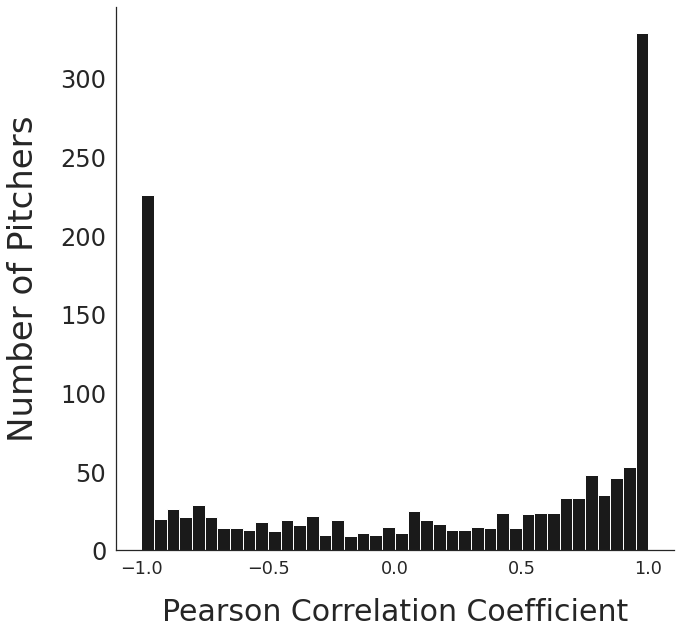

In [133]:
# Plot histogram of correlations between fastball speed and bias to throw the fastball
f, ax = plt.subplots(figsize=(10, 10))
plt.hist(x=corr_df['Correlation'], bins=40, color='k')
ax.set_title('', y=1.0, pad=-10, fontsize=30)
plt.yticks(fontsize=24)
plt.xticks(ticks=[-1, -0.5, 0, 0.5, 1])
plt.xlabel("Pearson Correlation Coefficient", fontsize=30, labelpad=20)
plt.ylabel("Number of Pitchers", fontsize=34, labelpad=20)
# Remove top and right spine on plot. 
right_side = ax.spines["right"]
right_side.set_visible(False)
top = ax.spines["top"]
top.set_visible(False)
plt.savefig('corr_speed_bias.png')
plt.show()

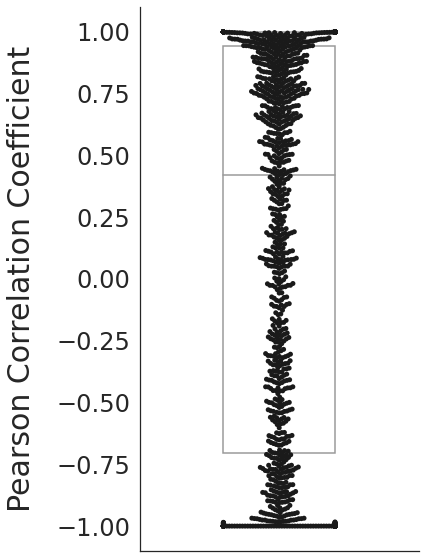

In [146]:
# Plot histogram of correlations between fastball speed and bias to throw the fastball
f, ax = plt.subplots(figsize=(5, 10))
sns.boxplot(y=corr_df['Correlation'], color='w')
sns.swarmplot(y='Correlation', data=corr_df, color='k')
# (x=corr_df['Correlation'], bins=40, color='k', density=True, cumulative=-1)
ax.set_title('', y=1.0, pad=-10, fontsize=30)
plt.yticks(fontsize=24)
plt.xticks(ticks=[-1, -0.5, 0, 0.5, 1])
plt.ylabel("Pearson Correlation Coefficient", fontsize=30, labelpad=20)
plt.xlabel("", fontsize=34, labelpad=20)
# Remove top and right spine on plot. 
right_side = ax.spines["right"]
right_side.set_visible(False)
top = ax.spines["top"]
top.set_visible(False)
plt.savefig('corr_speed_bias.png')
plt.show()

In [175]:
count = 0
for i in range(len(corr_df)):
  if corr_df['Correlation'][i]<=-0.70:
    count+=1
  # elif corr_df['Correlation'][i] <=-0.70:
  #   count+=1
  else:
    continue

print(count, len(corr_df), count/len(corr_df))

343 1358 0.25257731958762886


G7 3986 6687 0.5960819500523403
L7 0 6687 0.0
Overall: 3986 0.5961


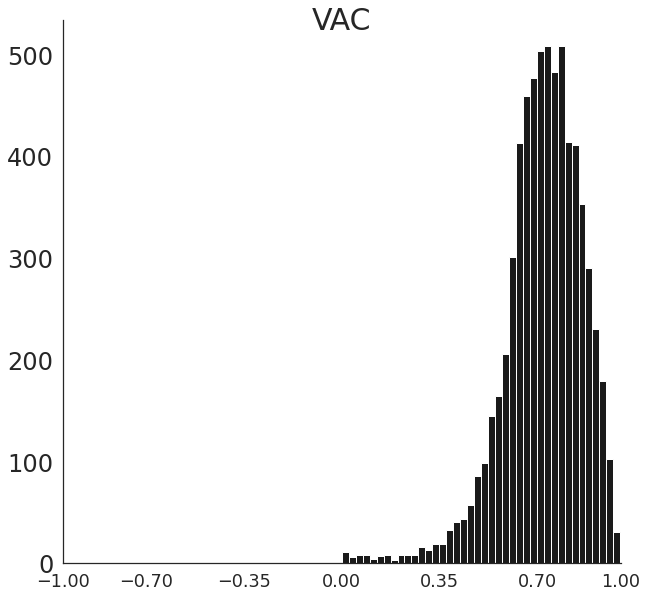




G7 2 6687 0.0002990877822640945
L7 9 6687 0.0013458950201884253
Overall: 11 0.0016


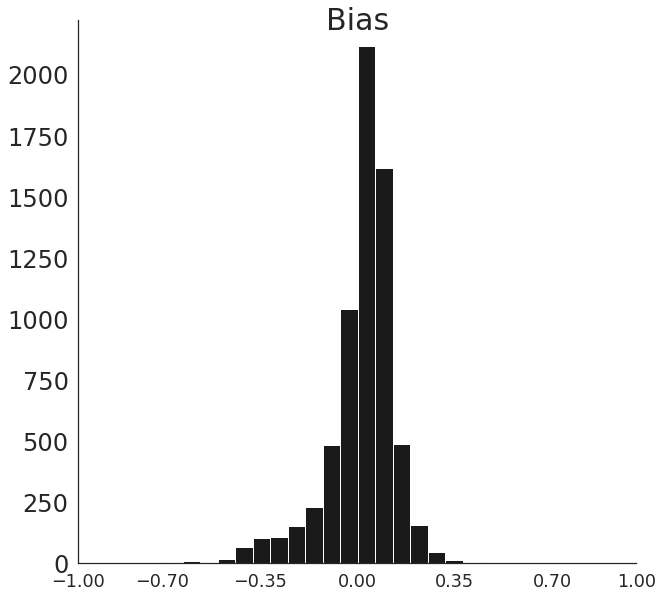




G7 4116 6687 0.6155226558995065
L7 1 6687 0.00014954389113204725
Overall: 4117 0.6157


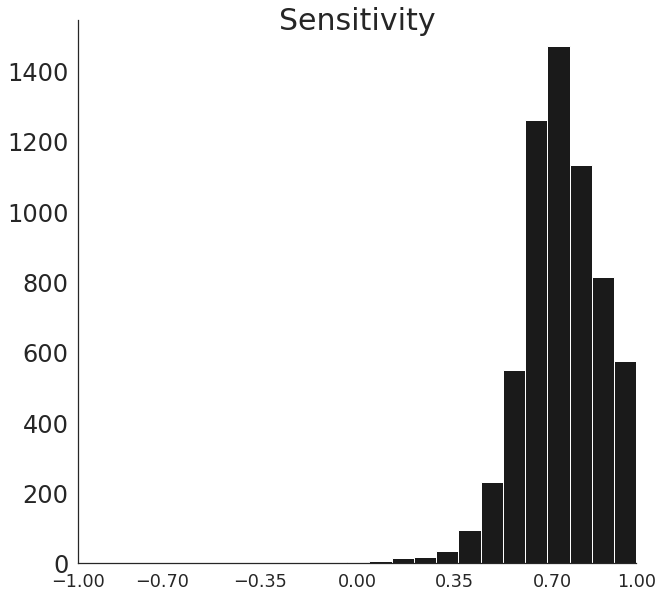




G7 6516 6687 0.9744279946164199
L7 0 6687 0.0
Overall: 6516 0.9744


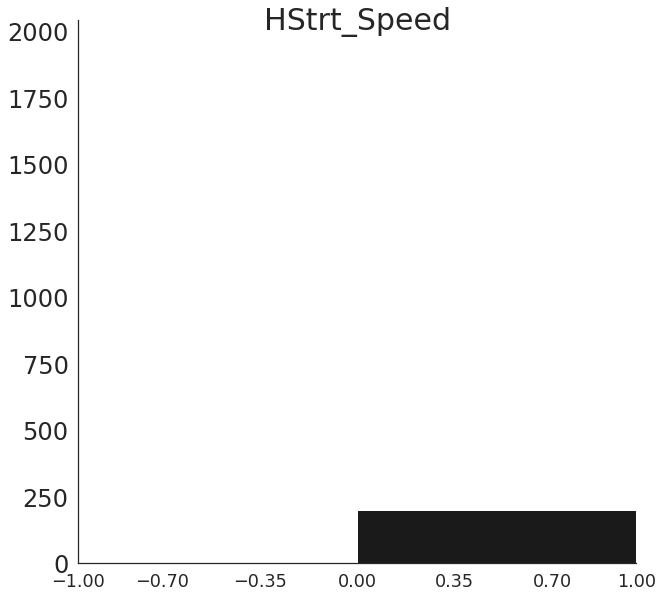




G7 5875 6687 0.8785703604007776
L7 0 6687 0.0
Overall: 5875 0.8786


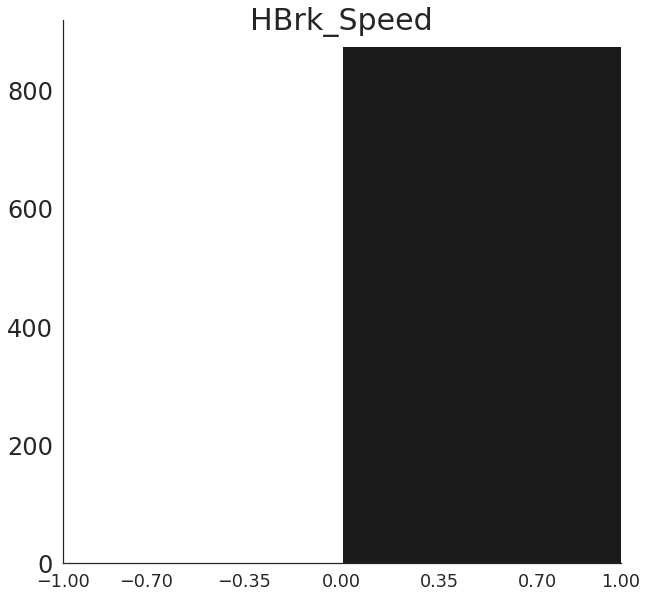




G7 5933 6687 0.8872439060864363
L7 0 6687 0.0
Overall: 5933 0.8872


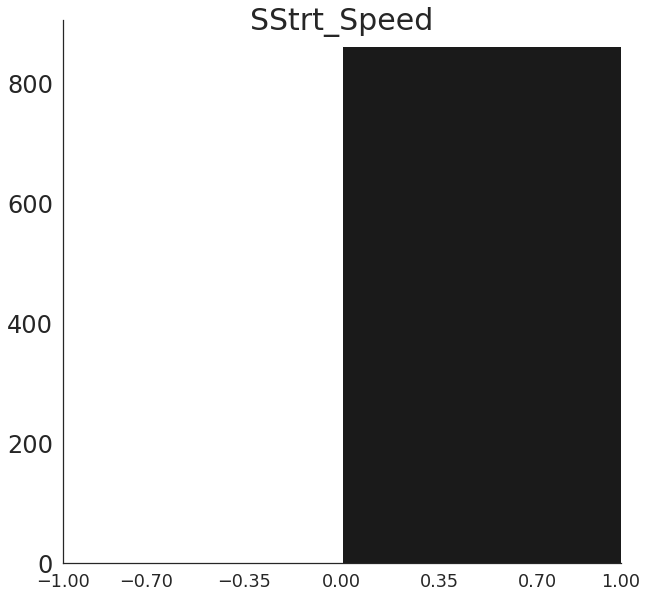




G7 4589 6687 0.6862569164049649
L7 0 6687 0.0
Overall: 4589 0.6863


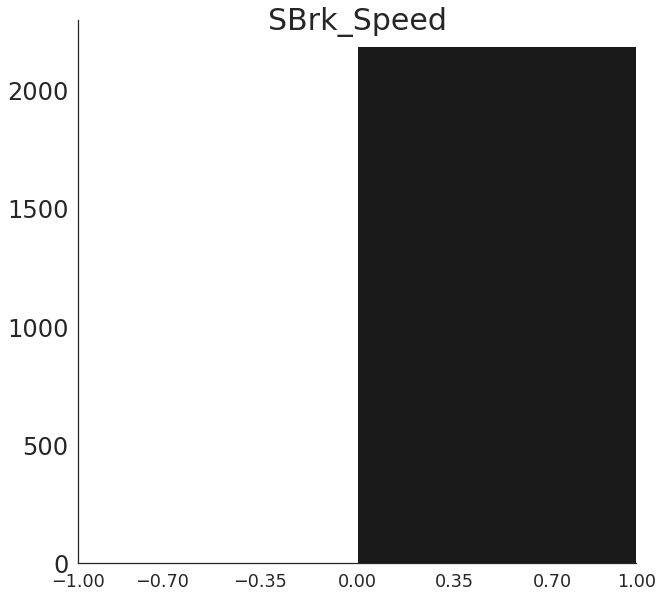




G7 213 6687 0.031852848811126065
L7 85 6687 0.012711230746224017
Overall: 298 0.0446


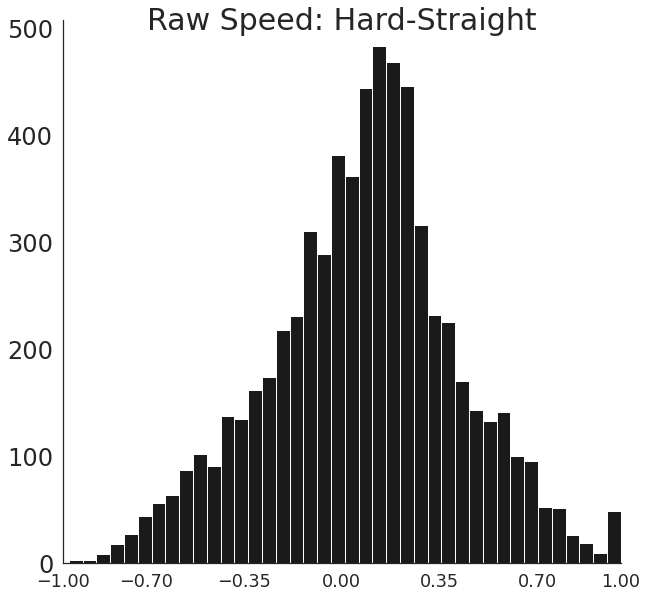




G7 399 6687 0.059668012561686856
L7 34 6687 0.005084492298489607
Overall: 433 0.0648


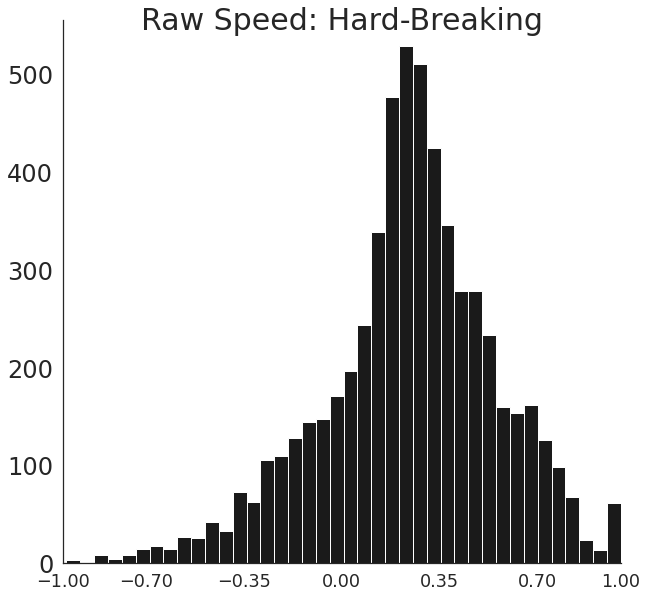




G7 442 6687 0.06609839988036488
L7 20 6687 0.0029908778226409452
Overall: 462 0.0691


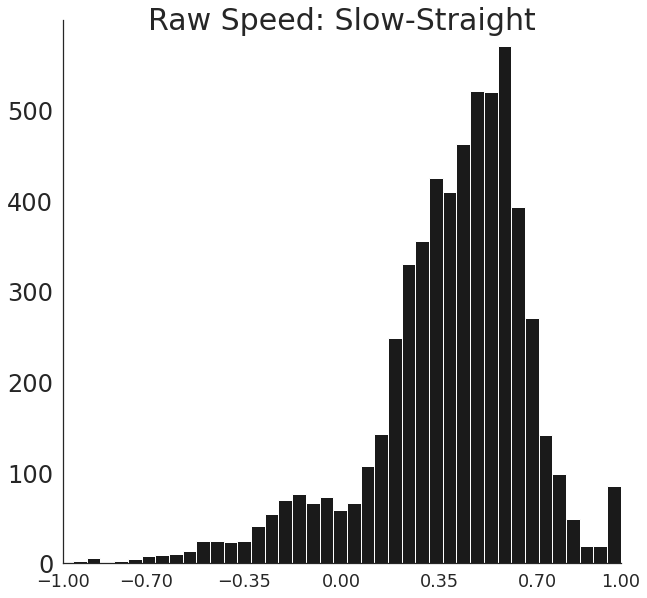




G7 400 6687 0.0598175564528189
L7 13 6687 0.0019440705847166143
Overall: 413 0.0618


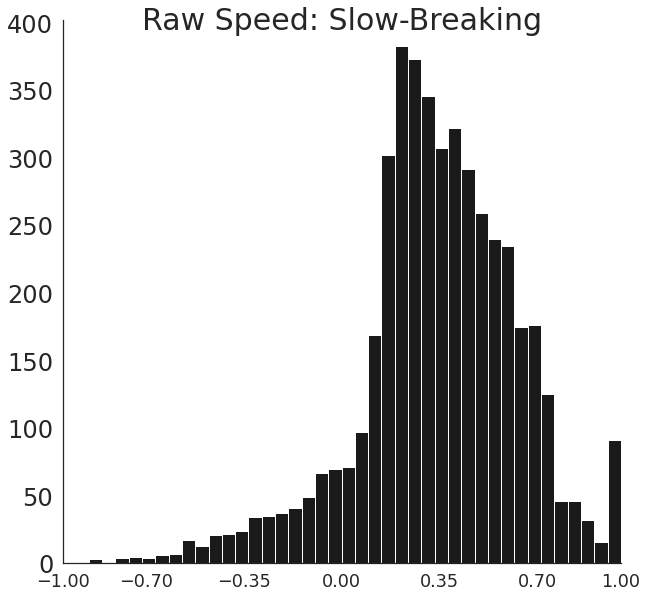




G7 28 6687 0.004187228951697323
L7 33 6687 0.00493494840735756
Overall: 61 0.0091


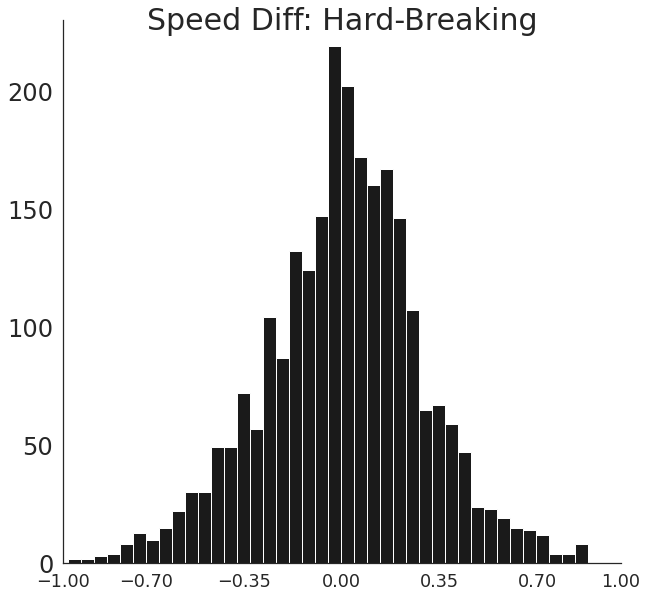




G7 18 6687 0.0026917900403768506
L7 28 6687 0.004187228951697323
Overall: 46 0.0069


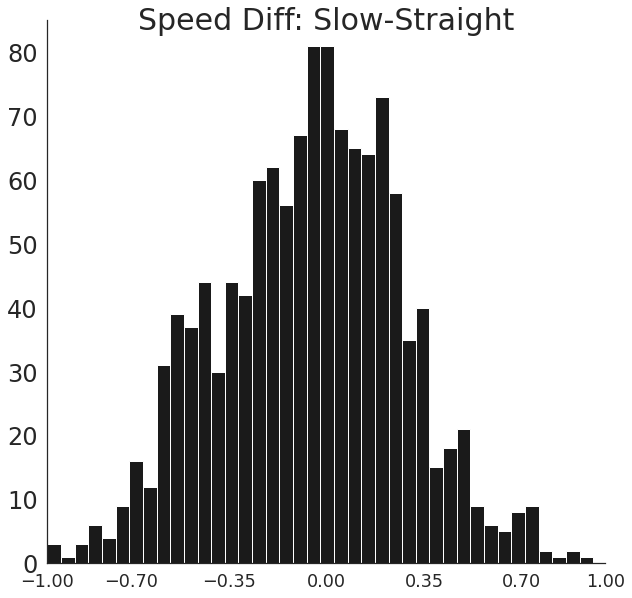




G7 12 6687 0.001794526693584567
L7 31 6687 0.004635860625093465
Overall: 43 0.0064


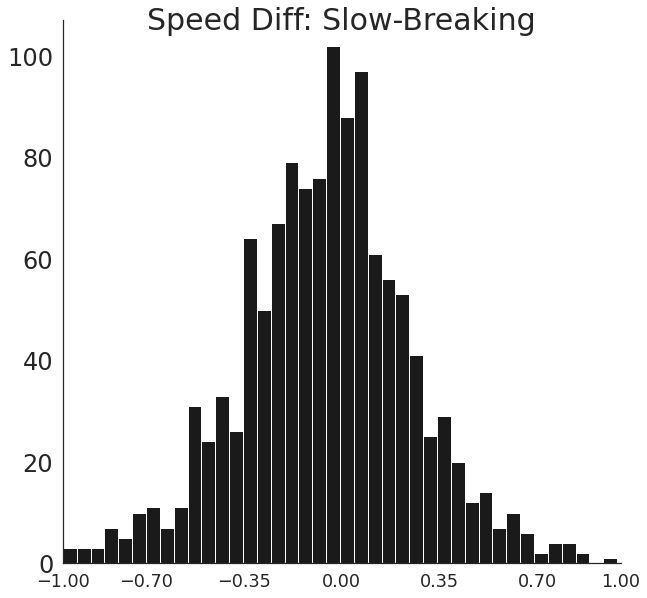




G7 145 6687 0.021683864214146854
L7 132 6687 0.01973979362943024
Overall: 277 0.0414


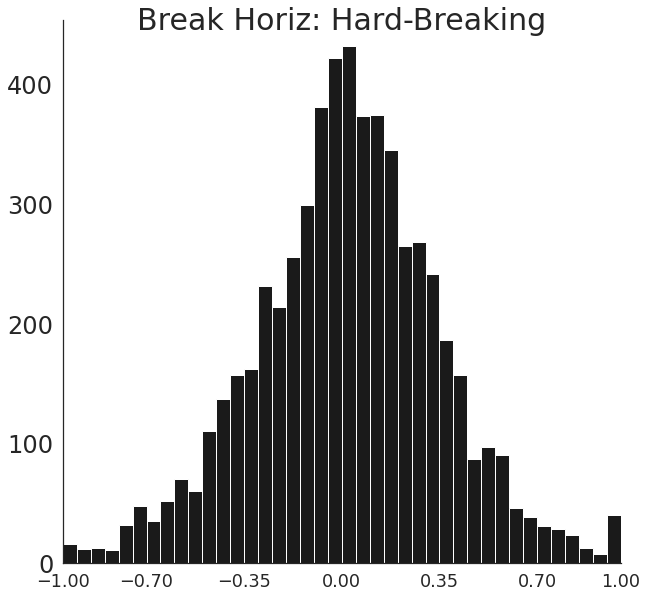




G7 201 6687 0.0300583221175415
L7 110 6687 0.016449828024525198
Overall: 311 0.0465


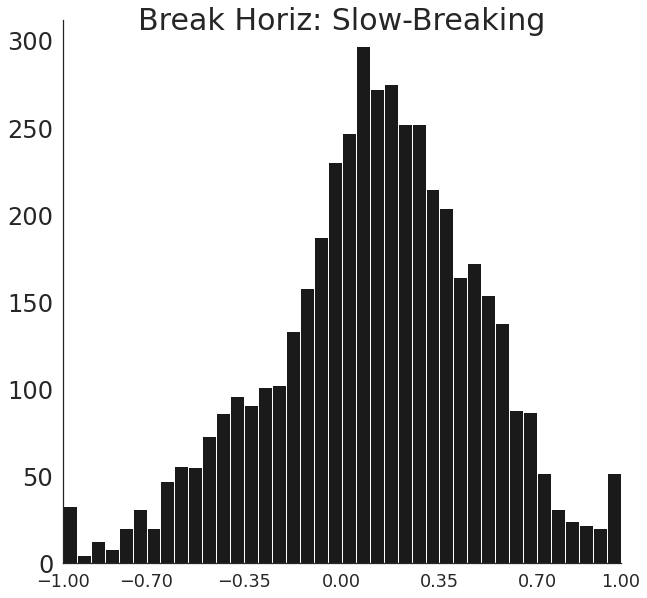




G7 196 6687 0.029310602661881263
L7 47 6687 0.007028562883206221
Overall: 243 0.0363


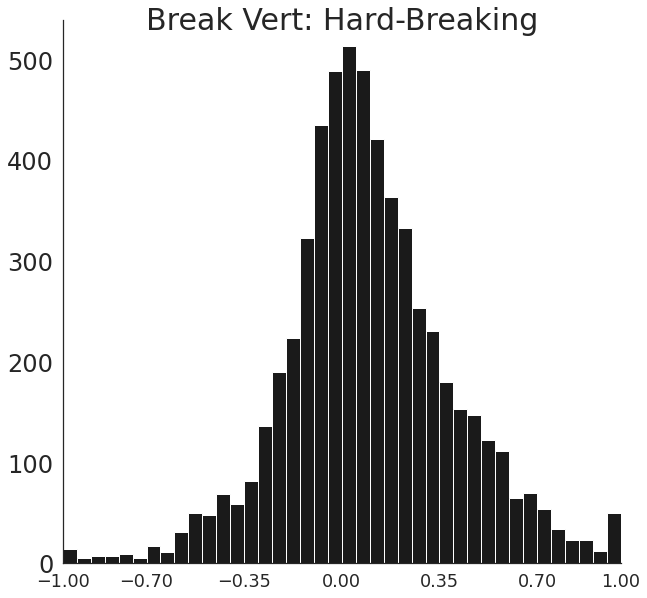




G7 62 6687 0.00927172125018693
L7 164 6687 0.02452519814565575
Overall: 226 0.0338


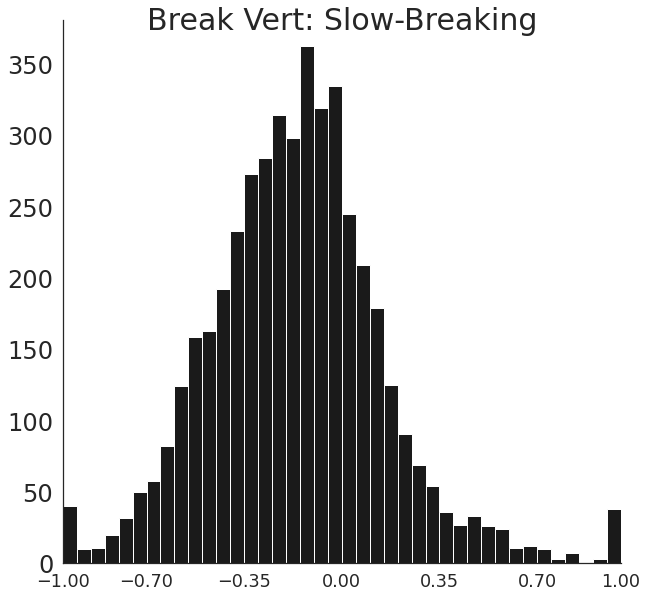




G7 196 6687 0.029310602661881263
L7 47 6687 0.007028562883206221
Overall: 243 0.0363


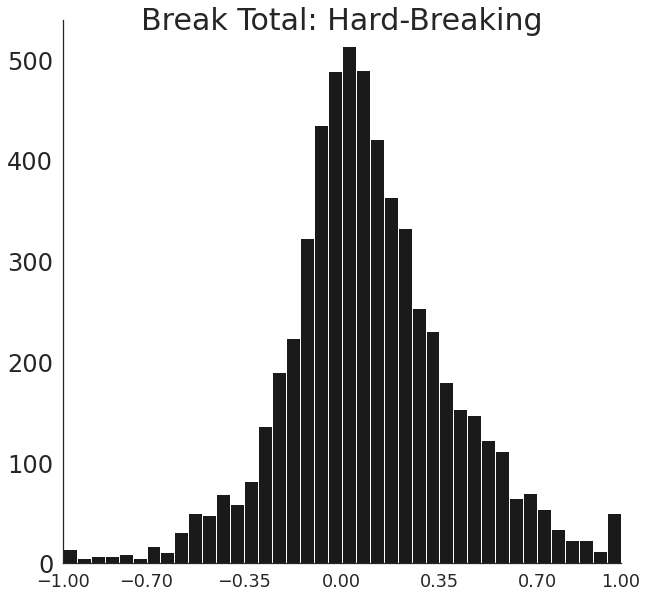




G7 62 6687 0.00927172125018693
L7 164 6687 0.02452519814565575
Overall: 226 0.0338


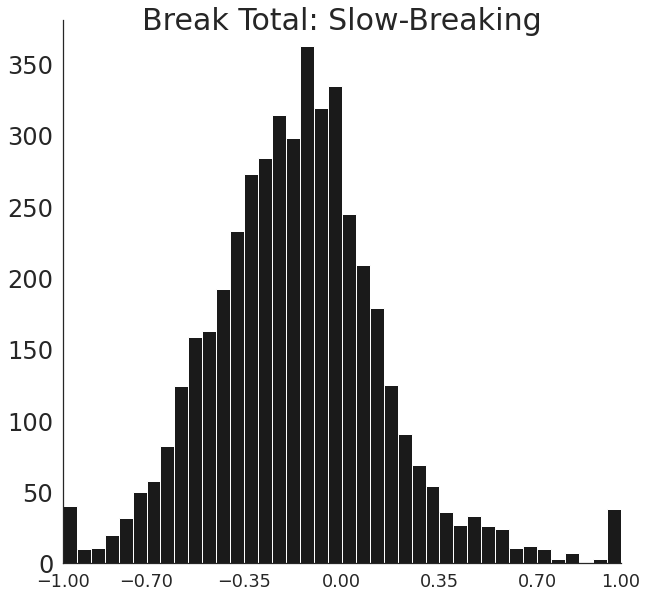




G7 66 6687 0.00986989681471512
L7 54 6687 0.008075370121130552
Overall: 120 0.0179


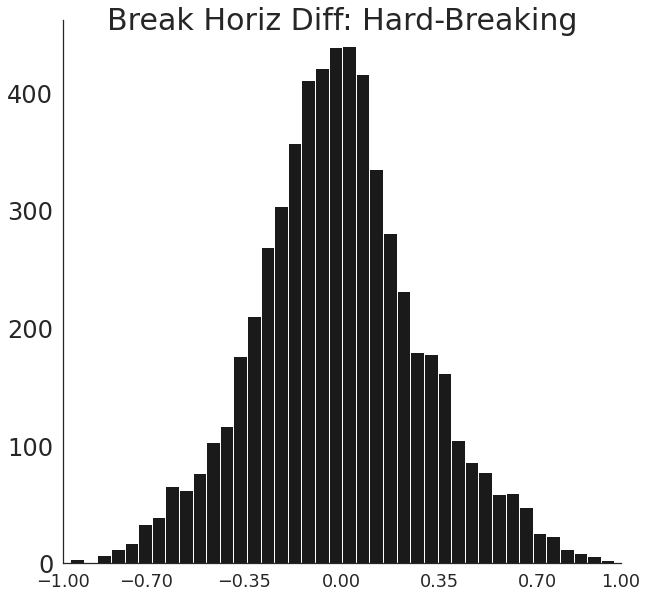




G7 44 6687 0.006579931209810079
L7 72 6687 0.010767160161507403
Overall: 116 0.0173


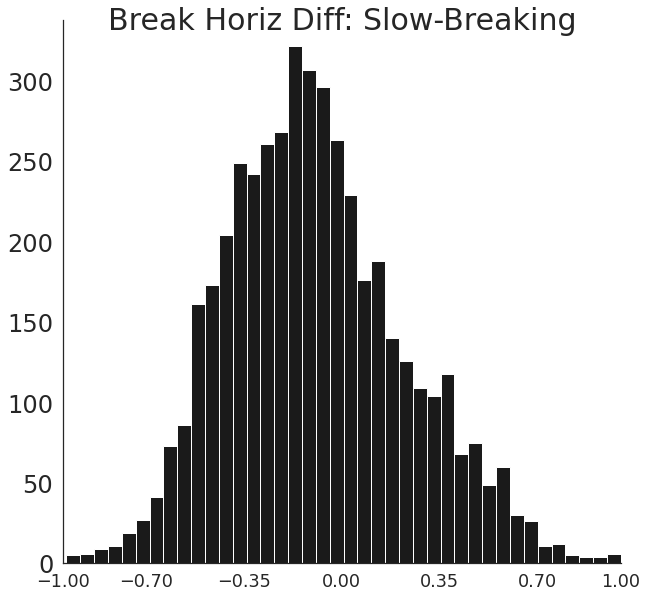




G7 31 6687 0.004635860625093465
L7 85 6687 0.012711230746224017
Overall: 116 0.0173


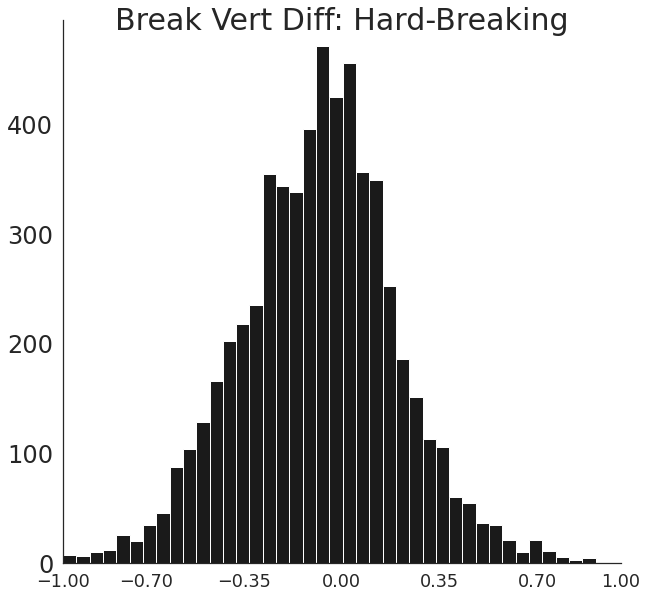




G7 53 6687 0.007925826229998505
L7 22 6687 0.0032899656049050394
Overall: 75 0.0112


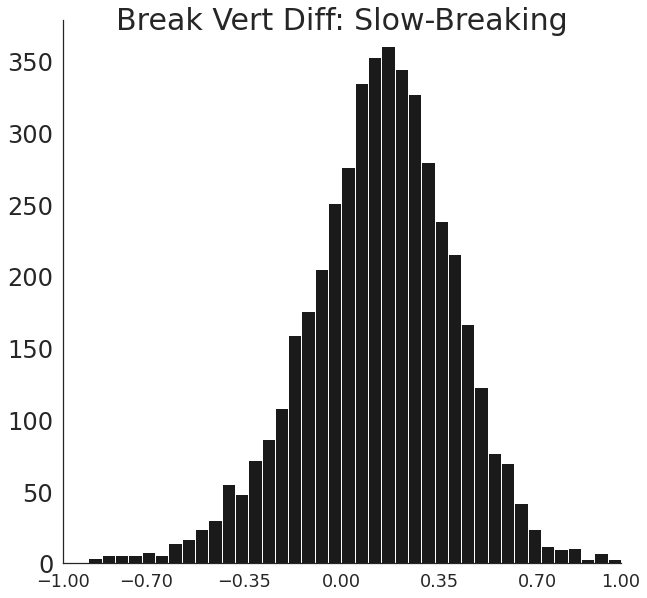




G7 23 6687 0.0034395094960370867
L7 127 6687 0.018992074173770003
Overall: 150 0.0224


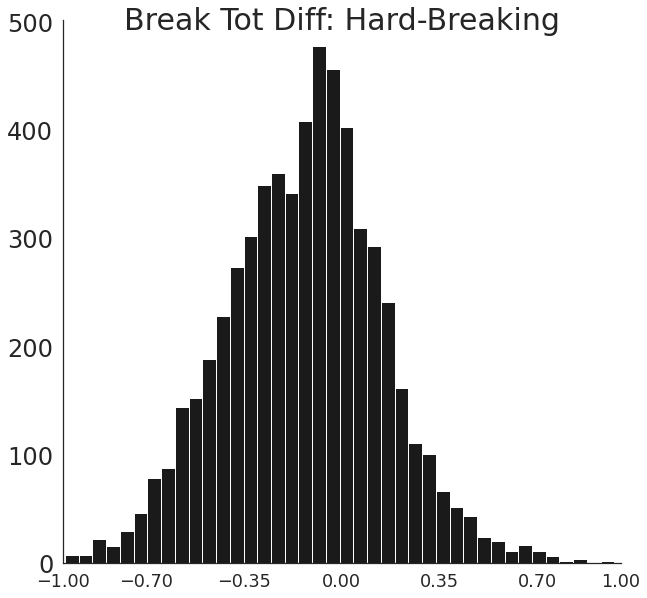




G7 15 6687 0.0022431583669807087
L7 98 6687 0.014655301330940632
Overall: 113 0.0169


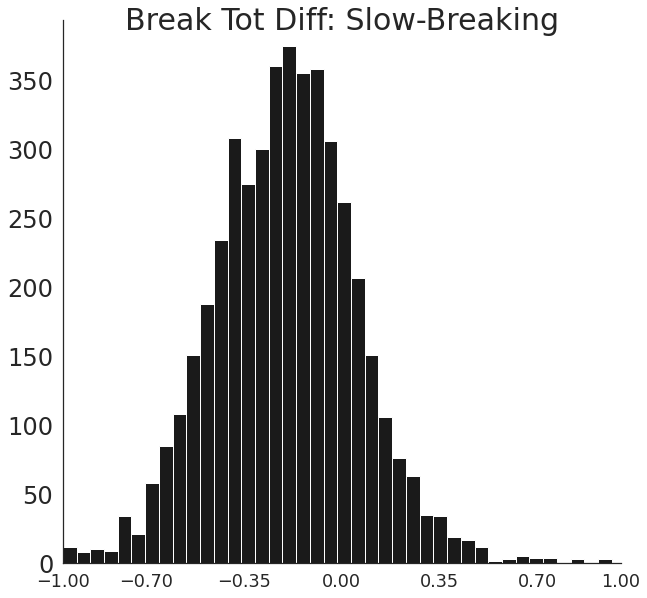

In [165]:
import matplotlib.pyplot as plt
desc_list = []
for i in list(hist_plots)[2:]:
  desc_list.append(hist_plots[i].describe()) # describe the distribution of each histogram
  c_g7 = 0
  c_l7 = 0
  for j in range(len(hist_plots)):
    if hist_plots[i][j] >=0.7:
      c_g7 +=1
    elif hist_plots[i][j] <=-0.7:
      c_l7 +=1
    else:
      continue
  print("G7", c_g7, len(hist_plots), c_g7/len(hist_plots))
  print("L7", c_l7, len(hist_plots), c_l7/len(hist_plots))
  print("Overall:", c_g7 + c_l7, round((c_g7/len(hist_plots) + c_l7/len(hist_plots)), 4))
  f, ax = plt.subplots(figsize=(10, 10))
  plt.hist(x=hist_plots[i], bins=40, color='k')
  ax.set_title(i, y=1.0, pad=-10, fontsize=30)
  plt.yticks(fontsize=24)
  plt.xticks(ticks=[-1, -0.7, -0.35, 0, 0.35, 0.7, 1])
  plt.xlim(-1, 1)
  plt.xlabel("", fontsize=20, labelpad=20)
  plt.ylabel("", fontsize=20, labelpad=20)
  # Remove top and right spine on plot. 
  right_side = ax.spines["right"]
  right_side.set_visible(False)
  top = ax.spines["top"]
  top.set_visible(False)
  plt.savefig('%s.png' %i)
  plt.show()
  print("\n\n")

In [97]:
# Turnit into a dataframe for reporting within manuscript. 
desc_list = pd.DataFrame(desc_list)
desc_list

,count,mean,std,min,25%,50%,75%,max
VAC,6687.0,0.720233,0.142184,0.0001,0.645450,0.73260,0.818750,0.9980
Bias,6687.0,0.014319,0.131421,-1.3786,-0.027900,0.03820,0.085400,1.1305
Sensitivity,6687.0,0.753292,0.169442,-1.3116,0.653400,0.74310,0.857650,1.8778
Raw Speed: Hard-Straight,6515.0,0.078959,0.338925,-0.9787,-0.124700,0.10160,0.276850,1.0000
Raw Speed: Hard-Breaking,5863.0,0.242602,0.313890,-0.9872,0.086750,0.25530,0.438700,1.0000
Raw Speed: Slow-Straight,5833.0,0.387282,0.284717,-0.9634,0.259800,0.43620,0.574200,1.0000
Raw Speed: Slow-Breaking,4563.0,0.341931,0.289107,-0.9069,0.195900,0.34340,0.533100,1.0000
Speed Diff: Hard-Breaking,2494.0,0.004777,0.285795,-0.9827,-0.164450,0.01345,0.181375,0.8839
Speed Diff: Slow-Straight,1228.0,-0.060396,0.327656,-1.0000,-0.281225,-0.04250,0.170550,0.9559
Speed Diff: Slow-Breaking,1218.0,-0.055276,0.304541,-1.0000,-0.243275,-0.04525,0.126800,0.9870


In [19]:
# Some functions for plotting a correlation matrix
def corrdot(*args, **kwargs):
    corr_r = args[0].corr(args[1], 'pearson')
    corr_text = f"{corr_r:2.2f}".replace("0.", ".")
    ax = plt.gca()
    ax.set_axis_off()
    marker_size = abs(corr_r) * 10000
    ax.scatter([.5], [.5], marker_size, [corr_r], alpha=0.6, cmap="coolwarm", \
               vmin=-1, vmax=1, transform=ax.transAxes)
    font_size = abs(corr_r) * 40 + 5
    ax.annotate(corr_text, [.5, .5,],  xycoords="axes fraction", ha='center', \
                va='center', fontsize=font_size)
    
def annotate_colname(x, **kws):
    ax = plt.gca()
    ax.annotate(x.name, xy=(0.05, 0.9), xycoords=ax.transAxes, fontweight='bold')
  
def corr_matrix(df, save_name):
  sns.set(style='white', font_scale=1.6)
  g = sns.PairGrid(df, aspect=1.4, diag_sharey=False)
  # g.map_lower(sns.regplot, scatter_kws={'s':10})
  g.map_upper(corrdot)
  g.map_lower(sns.scatterplot, color='k')
  g.map_diag(sns.distplot, kde_kws={'color': 'black'})
  g.map_diag(annotate_colname),
  for ax in g.axes.flatten():
      ax.tick_params(rotation = 90)
  plt.savefig(save_name)
  plt.show()

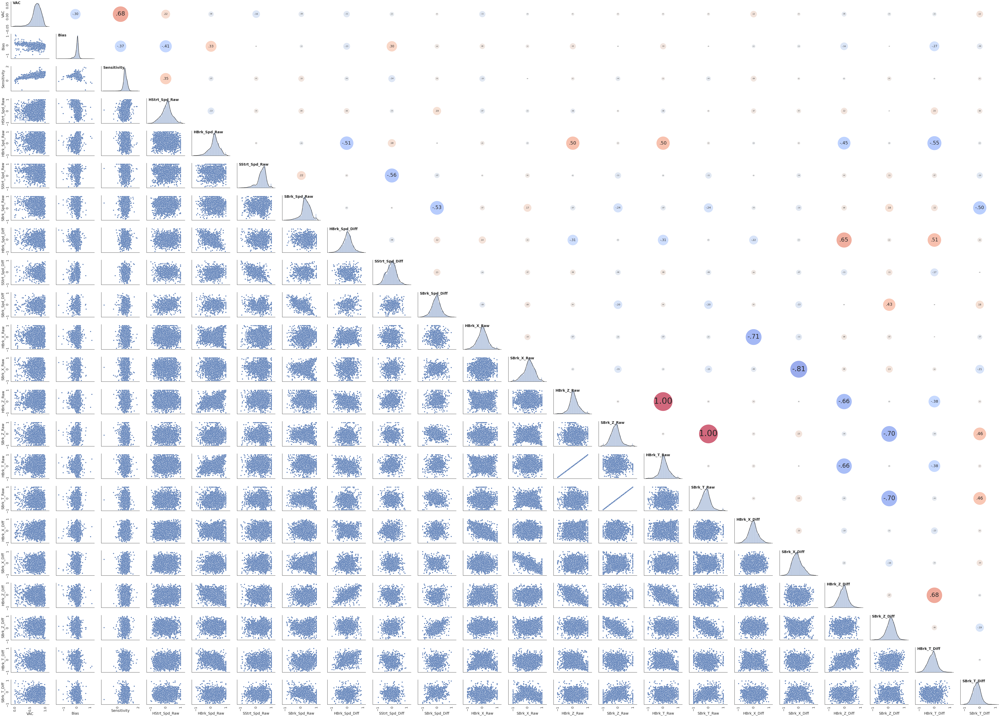

In [ ]:
# Plot visual
slim_list = list(player_fits)[2:]
player_fits_slim = player_fits[slim_list]
corr_matrix(df=player_fits_slim, 'corr_matrix.png')

# Plotting GME params and fits

In [ ]:
# If picking up fresh
player_fits = pd.read_csv('All_GME_Fits.csv').drop(['Unnamed: 0'], axis=1)
player_fits

,Player,Season,VAC,Bias,Sensitivity,HStrt_Spd_Raw,HBrk_Spd_Raw,SStrt_Spd_Raw,SBrk_Spd_Raw,HBrk_Spd_Diff,SStrt_Spd_Diff,SBrk_Spd_Diff,HBrk_X_Raw,SBrk_X_Raw,HBrk_Z_Raw,SBrk_Z_Raw,HBrk_T_Raw,SBrk_T_Raw,HBrk_X_Diff,SBrk_X_Diff,HBrk_Z_Diff,SBrk_Z_Diff,HBrk_T_Diff,SBrk_T_Diff
0,Ian Kennedy,2010,0.6816,0.0119,0.7053,0.2938,0.1934,-0.2048,0.0588,NaN,0.3446,-0.0237,0.0428,-0.0032,0.2612,0.0133,0.2612,0.0133,0.2339,-0.0605,-0.2406,0.0048,-0.3046,0.0214
1,Ian Kennedy,2011,0.7710,0.0085,0.7274,0.5704,0.2150,-0.1463,-0.2226,NaN,0.1771,0.0913,-0.0171,0.1215,0.2837,-0.1221,0.2837,-0.1221,0.3385,0.2269,-0.2928,0.2139,-0.3714,-0.1433
2,Ian Kennedy,2012,0.8487,-0.0031,0.8474,0.2389,0.5224,-0.1455,-0.3234,NaN,0.1878,0.3203,-0.0928,0.2748,0.5506,-0.1888,0.5506,-0.1888,0.2989,0.0007,-0.3930,0.3654,-0.4887,-0.1085
3,Ian Kennedy,2013,0.8411,0.0106,0.8292,0.1508,0.4697,-0.0774,-0.2475,NaN,0.1214,0.2622,-0.0569,0.2479,0.5139,-0.1608,0.5139,-0.1608,0.2105,-0.0447,-0.3585,0.3231,-0.3878,-0.0824
4,Ian Kennedy,2014,0.8205,0.0062,0.8148,0.0910,0.4724,-0.2685,-0.1426,NaN,0.1620,0.3045,0.0608,0.3600,0.4603,-0.2487,0.4603,-0.2487,0.0774,-0.2009,-0.2632,0.3700,-0.2977,-0.1531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6682,Reggie McClain,2019,0.7575,-0.6227,0.6968,NaN,-0.0977,0.4413,NaN,0.0977,-0.4413,NaN,0.1493,NaN,0.3362,NaN,0.3362,NaN,-0.1493,NaN,-0.3362,NaN,0.0572,NaN
6683,Taylor Guilbeau,2019,0.8609,-0.2171,1.0024,1.0000,0.2032,0.2790,NaN,-0.1466,-0.0019,NaN,0.0705,NaN,0.0450,NaN,0.0450,NaN,-0.1448,NaN,-0.1770,NaN,-0.1640,NaN
6684,Brandon Brennan,2019,0.8238,-0.1436,1.0210,0.6080,0.2942,0.2221,NaN,0.0078,-0.2457,NaN,-0.2964,NaN,-0.0496,NaN,-0.0496,NaN,0.0623,NaN,0.1071,NaN,-0.0186,NaN
6685,Yusei Kikuchi,2019,0.7035,-0.0106,0.8028,0.5278,0.4682,0.4635,0.2622,0.2795,NaN,0.3248,0.0895,-0.2156,0.4520,-0.5118,0.4520,-0.5118,0.3670,-0.0398,0.0046,0.4608,0.3675,-0.4195


In [5]:
# Load df with season stats for win-loss, ERA, WHIP, etc. 
season_stats = pd.read_csv('player_season_stats.csv')
season_stats

,Year,Player,Team,Age,G,GS,CG,SHO,IP,H,ER,K,BB,HR,W,L,SV,BS,HLD,ERA,WHIP
0,2010,Roy Halladay,PHI,43.0,33,33,9,4,250.2,231,68,219,30,24,21,10,0,0,0,2.44,1.04
1,2010,Felix Hernandez,SEA,34.0,34,34,6,1,249.2,194,63,232,70,17,13,12,0,0,0,2.27,1.06
2,2010,CC Sabathia,NYY,40.0,34,34,2,0,237.2,209,84,197,74,20,21,7,0,0,0,3.18,1.19
3,2010,Chris Carpenter,STL,45.0,35,35,1,0,235.0,214,84,179,63,21,16,9,0,0,0,3.22,1.18
4,2010,Adam Wainwright,STL,39.0,33,33,5,2,230.1,186,62,213,56,15,20,11,0,0,0,2.42,1.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7633,2019,Dellin Betances,NYY,33.0,1,0,0,0,0.2,0,0,2,0,0,0,0,0,0,0,0.00,0.00
7634,2019,Yennsy Diaz,TOR,24.0,1,0,0,0,0.2,1,2,0,4,0,0,0,0,0,0,27.00,7.50
7635,2019,Jose Castillo,SD,25.0,1,0,0,0,0.2,0,0,2,1,0,0,0,0,0,0,0.00,1.50
7636,2019,Austen Williams,WAS,28.0,2,0,0,0,0.1,5,6,1,1,2,0,0,0,0,0,162.00,18.00


In [11]:
fits_stats = player_fits.merge(season_stats, left_on=['Player', 'Season'], right_on=['Player', 'Year'])
fits_stats

,Player,Season,VAC,Bias,Sensitivity,HStrt_Spd_Raw,HBrk_Spd_Raw,SStrt_Spd_Raw,SBrk_Spd_Raw,HBrk_Spd_Diff,SStrt_Spd_Diff,SBrk_Spd_Diff,HBrk_X_Raw,SBrk_X_Raw,HBrk_Z_Raw,SBrk_Z_Raw,HBrk_T_Raw,SBrk_T_Raw,HBrk_X_Diff,SBrk_X_Diff,HBrk_Z_Diff,SBrk_Z_Diff,HBrk_T_Diff,SBrk_T_Diff,Year,Team,Age,G,GS,CG,SHO,IP,H,ER,K,BB,HR,W,L,SV,BS,HLD,ERA,WHIP
0,Ian Kennedy,2010,0.6816,0.0119,0.7053,0.2938,0.1934,-0.2048,0.0588,NaN,0.3446,-0.0237,0.0428,-0.0032,0.2612,0.0133,0.2612,0.0133,0.2339,-0.0605,-0.2406,0.0048,-0.3046,0.0214,2010,ARI,36.0,32,32,0,0,194.0,163,82,168,70,26,9,10,0,0,0,3.80,1.20
1,Ian Kennedy,2011,0.7710,0.0085,0.7274,0.5704,0.2150,-0.1463,-0.2226,NaN,0.1771,0.0913,-0.0171,0.1215,0.2837,-0.1221,0.2837,-0.1221,0.3385,0.2269,-0.2928,0.2139,-0.3714,-0.1433,2011,ARI,36.0,33,33,1,1,222.0,186,71,198,55,19,21,4,0,0,0,2.88,1.09
2,Ian Kennedy,2012,0.8487,-0.0031,0.8474,0.2389,0.5224,-0.1455,-0.3234,NaN,0.1878,0.3203,-0.0928,0.2748,0.5506,-0.1888,0.5506,-0.1888,0.2989,0.0007,-0.3930,0.3654,-0.4887,-0.1085,2012,ARI,36.0,33,33,1,0,208.1,216,93,187,55,28,15,12,0,0,0,4.02,1.30
3,Ian Kennedy,2013,0.8411,0.0106,0.8292,0.1508,0.4697,-0.0774,-0.2475,NaN,0.1214,0.2622,-0.0569,0.2479,0.5139,-0.1608,0.5139,-0.1608,0.2105,-0.0447,-0.3585,0.3231,-0.3878,-0.0824,2013,ARI,36.0,21,21,0,0,124.0,128,72,108,48,18,3,8,0,0,0,5.23,1.42
4,Ian Kennedy,2013,0.8411,0.0106,0.8292,0.1508,0.4697,-0.0774,-0.2475,NaN,0.1214,0.2622,-0.0569,0.2479,0.5139,-0.1608,0.5139,-0.1608,0.2105,-0.0447,-0.3585,0.3231,-0.3878,-0.0824,2013,SD,36.0,10,10,0,0,57.1,52,27,55,25,9,4,2,0,0,0,4.24,1.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6658,Reggie McClain,2019,0.7575,-0.6227,0.6968,NaN,-0.0977,0.4413,NaN,0.0977,-0.4413,NaN,0.1493,NaN,0.3362,NaN,0.3362,NaN,-0.1493,NaN,-0.3362,NaN,0.0572,NaN,2019,SEA,28.0,14,2,0,0,21.0,22,14,11,13,2,1,1,0,1,0,6.00,1.67
6659,Taylor Guilbeau,2019,0.8609,-0.2171,1.0024,1.0000,0.2032,0.2790,NaN,-0.1466,-0.0019,NaN,0.0705,NaN,0.0450,NaN,0.0450,NaN,-0.1448,NaN,-0.1770,NaN,-0.1640,NaN,2019,SEA,27.0,17,0,0,0,12.1,10,5,7,3,2,0,0,0,2,3,3.65,1.05
6660,Brandon Brennan,2019,0.8238,-0.1436,1.0210,0.6080,0.2942,0.2221,NaN,0.0078,-0.2457,NaN,-0.2964,NaN,-0.0496,NaN,-0.0496,NaN,0.0623,NaN,0.1071,NaN,-0.0186,NaN,2019,SEA,29.0,44,0,0,0,47.1,34,24,47,24,6,3,6,0,2,8,4.56,1.23
6661,Yusei Kikuchi,2019,0.7035,-0.0106,0.8028,0.5278,0.4682,0.4635,0.2622,0.2795,NaN,0.3248,0.0895,-0.2156,0.4520,-0.5118,0.4520,-0.5118,0.3670,-0.0398,0.0046,0.4608,0.3675,-0.4195,2019,SEA,29.0,32,32,1,1,161.2,195,98,116,50,36,6,11,0,0,0,5.46,1.52


In [91]:
# Trim the fits_stats df down to only those we're interested in comparing
fits_stats = fits_stats[['Player', 'Season', 'VAC', 'Bias', 'Sensitivity', 'CG', 'SHO', 'IP', 'ER', 'HR', 'W', 'L', 'SV', 'BS', 'HLD', 'ERA', 'WHIP']]
fits_stats

,Player,Season,VAC,Bias,Sensitivity,CG,SHO,IP,ER,HR,W,L,SV,BS,HLD,ERA,WHIP
0,Ian Kennedy,2010,0.6816,0.0119,0.7053,0,0,194.0,82,26,9,10,0,0,0,3.80,1.20
1,Ian Kennedy,2011,0.7710,0.0085,0.7274,1,1,222.0,71,19,21,4,0,0,0,2.88,1.09
2,Ian Kennedy,2012,0.8487,-0.0031,0.8474,1,0,208.1,93,28,15,12,0,0,0,4.02,1.30
3,Ian Kennedy,2013,0.8411,0.0106,0.8292,0,0,124.0,72,18,3,8,0,0,0,5.23,1.42
4,Ian Kennedy,2013,0.8411,0.0106,0.8292,0,0,57.1,27,9,4,2,0,0,0,4.24,1.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6658,Reggie McClain,2019,0.7575,-0.6227,0.6968,0,0,21.0,14,2,1,1,0,1,0,6.00,1.67
6659,Taylor Guilbeau,2019,0.8609,-0.2171,1.0024,0,0,12.1,5,2,0,0,0,2,3,3.65,1.05
6660,Brandon Brennan,2019,0.8238,-0.1436,1.0210,0,0,47.1,24,6,3,6,0,2,8,4.56,1.23
6661,Yusei Kikuchi,2019,0.7035,-0.0106,0.8028,1,1,161.2,98,36,6,11,0,0,0,5.46,1.52


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

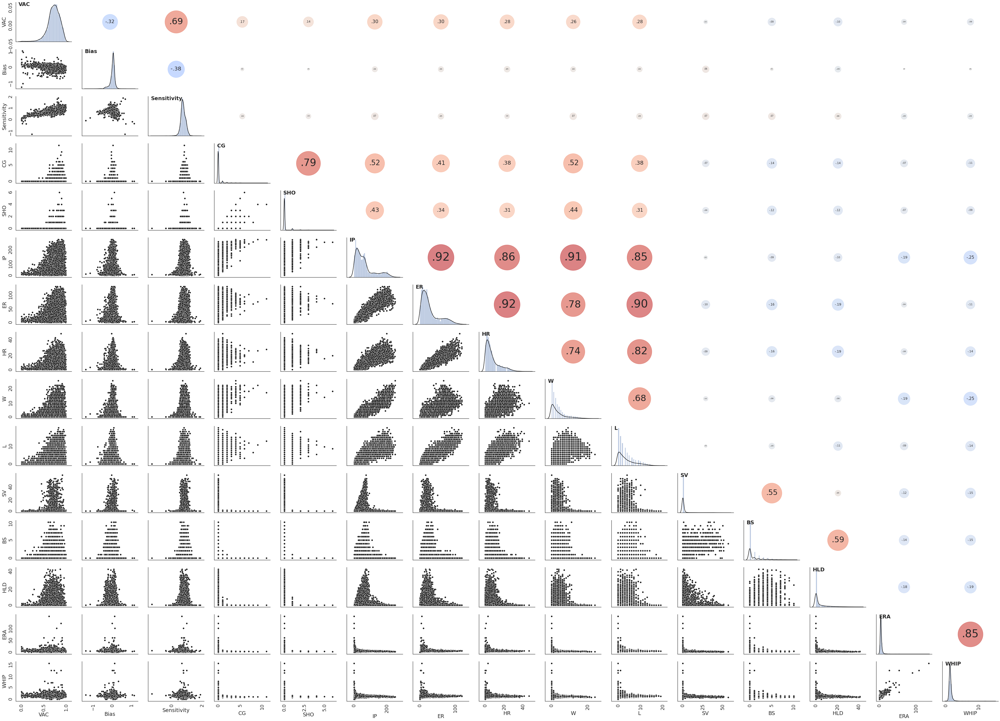

In [92]:
# Correlation matrix of matching params with stats
# Plot visual
data_list = list(fits_stats)[2:]
plot_fits_stats = fits_stats[data_list]
corr_matrix(df=plot_fits_stats, save_name='corr_matrix_stats.png')

In [ ]:
# Get the number of pitcher-seasons where vac greater than 80%, 90%, and 95%
eighty = len(player_fits[player_fits['VAC']>=0.80])
ninety = len(player_fits[player_fits['VAC']>=0.90])
ninety_five = len(player_fits[player_fits['VAC']>=0.95])
sixty = len(player_fits[player_fits['VAC']<=0.60])
fifty = len(player_fits[player_fits['VAC']<=0.50])

# Get the percentages for each
eighty_per = eighty/6687
ninety_per = ninety/6687
ninety_five_per = ninety_five/6687
sixty_per = sixty/6687
fifty_per = fifty/6687

# Print them
print("Less than 50 - %s, %s" %(fifty, fifty_per))
print("less than 60 - %s, %s" %(sixty, sixty_per))
print("Greater than 80 - %s, %s" %(eighty, eighty_per))
print("Greater than 90 - %s, %s" %(ninety, ninety_per))
print("Greater than 95 - %s, %s" %(ninety_five, ninety_five_per))

Less than 50 - 409, 0.06116345147300733
less than 60 - 1039, 0.1553761028861971
Greater than 80 - 1978, 0.29579781665918947
Greater than 90 - 531, 0.07940780619111709
Greater than 95 - 123, 0.018393898609241812


In [ ]:
# Get the number of pitcher-seasons where sensitivity was greater than 0.10 or less than -0.10
bias_pos = len(player_fits[player_fits['Bias']>=.10])
bias_neg = len(player_fits[player_fits['Bias']<=-0.10])
bias_mid = 6687 - bias_pos - bias_neg

# Get the percentages for each
bias_pos_per = bias_pos/6687
bias_neg_per = bias_neg/6687
bias_mid_per = bias_mid/6687

# Print them
print("Greater than 0.1 - %s, %s" %(bias_pos, bias_pos_per))
print("less than -0.1 - %s, %s" %(bias_neg, bias_neg_per))
print("Around 0 - %s, %s" %(bias_mid, bias_mid_per))

Greater than 0.1 - 1271, 0.19007028562883208
less than -0.1 - 855, 0.1278600269179004
Around 0 - 4561, 0.6820696874532676


In [ ]:
# Get the number of pitcher-seasons where sensitivity was greater than 0.10 or less than -0.10
sens_pos = len(player_fits[player_fits['Sensitivity']>=1.10])
sens_neg = len(player_fits[player_fits['Sensitivity']<=0.90])
sens_mid = 6687 - sens_pos - sens_neg

# Get the percentages for each
sens_pos_per = sens_pos/6687
sens_neg_per = sens_neg/6687
sens_mid_per = sens_mid/6687

# Print them
print("Greater than 1.1 - %s, %s" %(sens_pos, sens_pos_per))
print("less than 0.9 - %s, %s" %(sens_neg, sens_neg_per))
print("Around 1 - %s, %s" %(sens_mid, sens_mid_per))

Greater than 1.1 - 139, 0.02078660086735457
less than 0.9 - 5422, 0.8108269777179602
Around 1 - 1126, 0.1683864214146852


In [ ]:
season_descriptions = player_fits.groupby(by=['Season']).describe()
season_descriptions

VAC                              ... SBrk_T_Diff                           
        count      mean       std     min  ...         25%      50%       75%     max
Season                                     ...                                       
2009    568.0  0.706489  0.159763  0.0060  ...   -0.365750 -0.18430  0.004750  0.5449
2010    544.0  0.705809  0.154135  0.0006  ...   -0.363800 -0.18440 -0.052900  0.8472
2011    565.0  0.708187  0.152636  0.0004  ...   -0.356750 -0.18670 -0.056200  0.9470
2012    584.0  0.723462  0.130734  0.0166  ...   -0.365475 -0.17710 -0.040100  0.5068
2013    590.0  0.728238  0.128518  0.0873  ...   -0.330450 -0.15285 -0.028600  0.4417
2014    583.0  0.724976  0.133677  0.0001  ...   -0.321575 -0.17955 -0.048675  0.8423
2015    631.0  0.718457  0.142085  0.0014  ...   -0.370000 -0.20990 -0.063000  0.9068
2016    623.0  0.717982  0.146915  0.0024  ...   -0.385700 -0.20550 -0.036400  0.9675
2017    648.0  0.730845  0.145986  0.0500  ...   -0.382600 -0.20860 -0.033100  0.7345
2018    660.0  0.724840  0.134817  0.0099  ...   -0.405750 -0.23400 -0.028175  0.7325
2019    691.0  0.728471  0.132710  0.0321  ...   -0.425950 -0.21890 -0.030200  0.9602

[11 rows x 176 columns]

In [ ]:
!pip install researchpy
import researchpy
season_desc = researchpy.summary_cont(player_fits.groupby(by=['Season']))
season_desc

VAC                          ... SBrk_T_Diff                           
          N    Mean      SD      SE  ...          SD      SE 95% Conf. Interval
Season                               ...                                       
2009    568  0.7065  0.1598  0.0067  ...      0.2704  0.0144   -0.2216  -0.1649
2010    544  0.7058  0.1541  0.0066  ...      0.2545  0.0138   -0.2151  -0.1609
2011    565  0.7082  0.1526  0.0064  ...      0.2430  0.0130   -0.2216  -0.1706
2012    584  0.7235  0.1307  0.0054  ...      0.2431  0.0123   -0.2145  -0.1661
2013    590  0.7282  0.1285  0.0053  ...      0.2157  0.0107   -0.1924  -0.1504
2014    583  0.7250  0.1337  0.0055  ...      0.2265  0.0113   -0.2066  -0.1623
2015    631  0.7185  0.1421  0.0057  ...      0.2408  0.0114   -0.2334  -0.1885
2016    623  0.7180  0.1469  0.0059  ...      0.2580  0.0122   -0.2277  -0.1798
2017    648  0.7308  0.1460  0.0057  ...      0.2643  0.0123   -0.2337  -0.1854
2018    660  0.7248  0.1348  0.0052  ...      0.2768  0.0128   -0.2461  -0.1956
2019    691  0.7285  0.1327  0.0050  ...      0.2965  0.0133   -0.2414  -0.1893

[11 rows x 132 columns]

In [ ]:
def season_swarm_box(y_val, hue_col, palette_val, y_label, y_min=None, y_max=None, fig_size=(15, 12)):
  f, ax = plt.subplots(figsize=fig_size)
  sns.swarmplot(x="Season", y=y_val, hue=hue_col, data=player_fits, palette=palette_val)
  sns.boxplot(x="Season", y=y_val, data=player_fits, boxprops={'facecolor':'None'})
  plt.xticks(fontsize=50)
  plt.ylim(y_min, y_max)
  plt.yticks(fontsize=50)
  plt.xlabel("MLB Season", fontsize=60, labelpad=(20))
  plt.ylabel(y_label, fontsize=60, labelpad=(20))
  ax.get_legend().remove()
  right_side = ax.spines["right"]
  right_side.set_visible(False)
  top = ax.spines["top"]
  top.set_visible(False)
  plt.show()

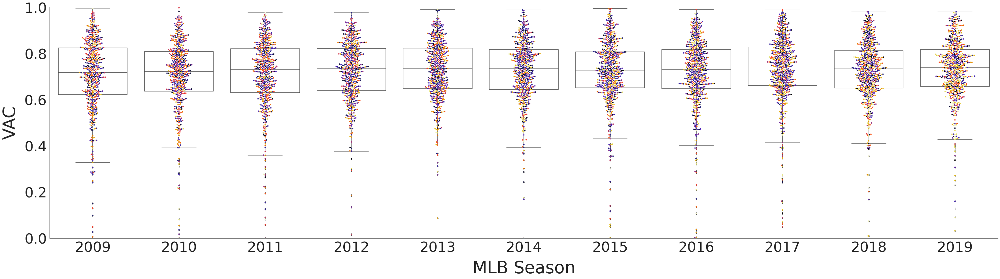

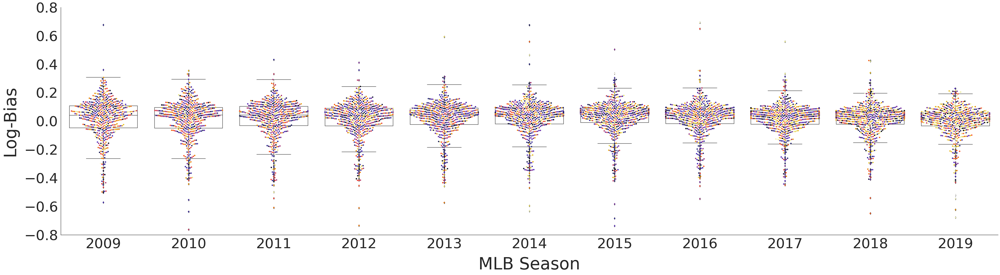

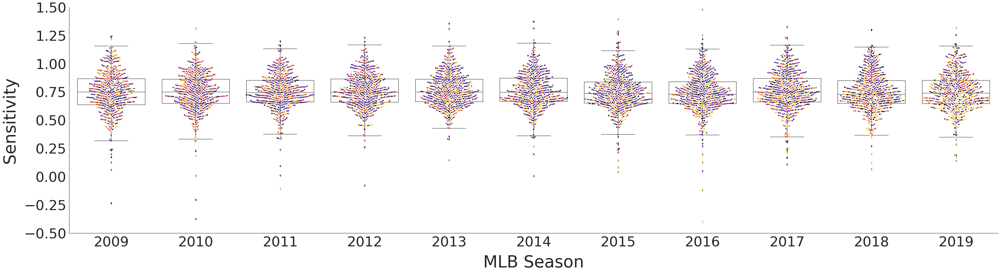

In [ ]:
season_swarm_box(y_val='VAC', hue_col='Player', palette_val='CMRmap', y_label='VAC', y_min=0, y_max=1, fig_size=(60,15))
season_swarm_box(y_val='Bias', hue_col='Player',palette_val='CMRmap', y_label='Log-Bias', y_min=-0.8, y_max=0.8, fig_size=(60, 15))
season_swarm_box(y_val='Sensitivity', hue_col='Player', palette_val='CMRmap', y_label='Sensitivity', y_min=-0.5, y_max=1.5, fig_size=(60, 15))

# Add starter-reliever label to the dataframe

In [ ]:
# Read in the df of starting pitchers for each season
starters = pd.read_excel('Starting_Pitchers_09_19.xlsx')
starters

,season_2019,season_2018,season_2017,season_2016,season_2015,season_2014,season_2013,season_2012,season_2011,season_2010,season_2009
0,Austin Adams,Chance Adams,Tim Adleman,Tim Adleman,Henderson Alvarez III,Henderson Alvarez III,Alfredo Aceves,Fernando Abad,Alfredo Aceves,Brett Anderson,Alfredo Aceves
1,Austin Adams,Sandy Alcantara,Andrew Albers,Andrew Albers,Brett Anderson,Brett Anderson,Andrew Albers,Nathan Adcock,Nathan Adcock,Jake Arrieta,Nick Adenhart
2,Dario Agrazal,Scott Alexander,Raul Alcantara,Matt Albers,Chase Anderson,Chase Anderson,Henderson Alvarez III,Henderson Alvarez III,Henderson Alvarez III,Bronson Arroyo,Brett Anderson
3,Sandy Alcantara,Kolby Allard,Henderson Alvarez III,Raul Alcantara,Cody Anderson,Chris Archer,Jose Alvarez,Brett Anderson,Brett Anderson,Scott Atchison,Bronson Arroyo
4,Tyler Alexander,Brett Anderson,Brett Anderson,Brett Anderson,Matt Andriese,Jake Arrieta,Brett Anderson,Chris Archer,Jake Arrieta,Luis Atilano,Bryan Augenstein
...,...,...,...,...,...,...,...,...,...,...,...
425,Ryan Yarbrough,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
426,Gabriel Ynoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
427,Alex Young,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
428,T.J. Zeuch,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Create list of starter for each season
starters_19 = starters['season_2019'].dropna().unique().tolist()
starters_18 = starters['season_2018'].dropna().unique().tolist()
starters_17 = starters['season_2017'].dropna().unique().tolist()
starters_16 = starters['season_2016'].dropna().unique().tolist()
starters_15 = starters['season_2015'].dropna().unique().tolist()
starters_14 = starters['season_2014'].dropna().unique().tolist()
starters_13 = starters['season_2013'].dropna().unique().tolist()
starters_12 = starters['season_2012'].dropna().unique().tolist()
starters_11 = starters['season_2011'].dropna().unique().tolist()
starters_10 = starters['season_2010'].dropna().unique().tolist()
starters_09 = starters['season_2009'].dropna().unique().tolist()

In [ ]:
# Create lists of 'starter' vs 'reliever' labels for each observation in the 
# player_fits df. 
start_relief = []

for i in range(len(player_fits)):
  season = player_fits['Season'][i]
  if season==2009:
    if player_fits['Player'][i] in starters_09:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2010:
    if player_fits['Player'][i] in starters_10:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2011:
    if player_fits['Player'][i] in starters_11:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2012:
    if player_fits['Player'][i] in starters_12:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2013:
    if player_fits['Player'][i] in starters_13:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2014:
    if player_fits['Player'][i] in starters_14:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2015:
    if player_fits['Player'][i] in starters_15:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2016:
    if player_fits['Player'][i] in starters_16:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2017:
    if player_fits['Player'][i] in starters_17:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2018:
    if player_fits['Player'][i] in starters_18:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  elif season==2019:
    if player_fits['Player'][i] in starters_19:
      start_relief.append('starter')
    else:
      start_relief.append('reliever')
  else:
    start_relief.append('Unknown')

player_fits['starter_reliever'] = start_relief

In [ ]:
import researchpy
start_rel = researchpy.summary_cont(player_fits.groupby(by=['starter_reliever']))
start_rel

Season                     ... SBrk_T_Diff                   
                      N       Mean      SD  ...          SE 95% Conf. Interval
starter_reliever                            ...                               
reliever           3686  2014.1701  3.1364  ...      0.0054   -0.2739  -0.2527
starter            3001  2014.2732  3.2210  ...      0.0051   -0.1615  -0.1417

[2 rows x 138 columns]

In [ ]:
680.106# Stats for starters and relievers
import statsmodels.stats.weightstats as sts
starters = player_fits[player_fits['starter_reliever']=='starter']
relievers = player_fits[player_fits['starter_reliever']=='reliever']
vac_ttest = sts.ttest_ind(x1=starters['VAC'], x2=relievers['VAC'])
bias_ttest = sts.ttest_ind(x1=starters['Bias'], x2=relievers['Bias'])
sensitivity_ttest = sts.ttest_ind(x1=starters['Sensitivity'], x2=relievers['Sensitivity'])

# Print it uot
def print_results(player_fits):
  print('tstat=%s' %player_fits[0], '\np-val=%s' %player_fits[1], '\ndeg_free=%s' %player_fits[2])

print("VAC:")
print_results(vac_ttest)
print("\nBias:")
print_results(bias_ttest)
print("\nSensitivity:")
print_results(sensitivity_ttest)

VAC:
tstat=25.019964969544972 
p-val=3.816986767705034e-132 
deg_free=6685.0

Bias:
tstat=3.018602924600597 
p-val=0.0025490080752427185 
deg_free=6685.0

Sensitivity:
tstat=0.1666921969078463 
p-val=0.8676172870409588 
deg_free=6685.0


In [ ]:
def season_swarm_start_rel(x_val, y_val,  y_label, color=None, palette_val=None, hue_col=None, y_min=None, y_max=None, fig_size=(15, 12)):
  f, ax = plt.subplots(figsize=fig_size)
  sns.swarmplot(x=x_val, y=y_val, hue=hue_col, data=player_fits, color=color, palette=palette_val)
  plt.xticks(ticks=[0, 1], labels=['Starters', 'Relievers'], fontsize=60)
  plt.ylim(y_min, y_max)
  plt.yticks(fontsize=60)
  plt.xlabel("", fontsize=40, labelpad=(16))
  plt.ylabel(y_label, fontsize=60, labelpad=(16))
  plt.legend(loc='upper center', fontsize=20, frameon=False)
  ax.get_legend().remove()
  right_side = ax.spines["right"]
  right_side.set_visible(False)
  top = ax.spines["top"]
  top.set_visible(False)
  plt.show()

No handles with labels found to put in legend.


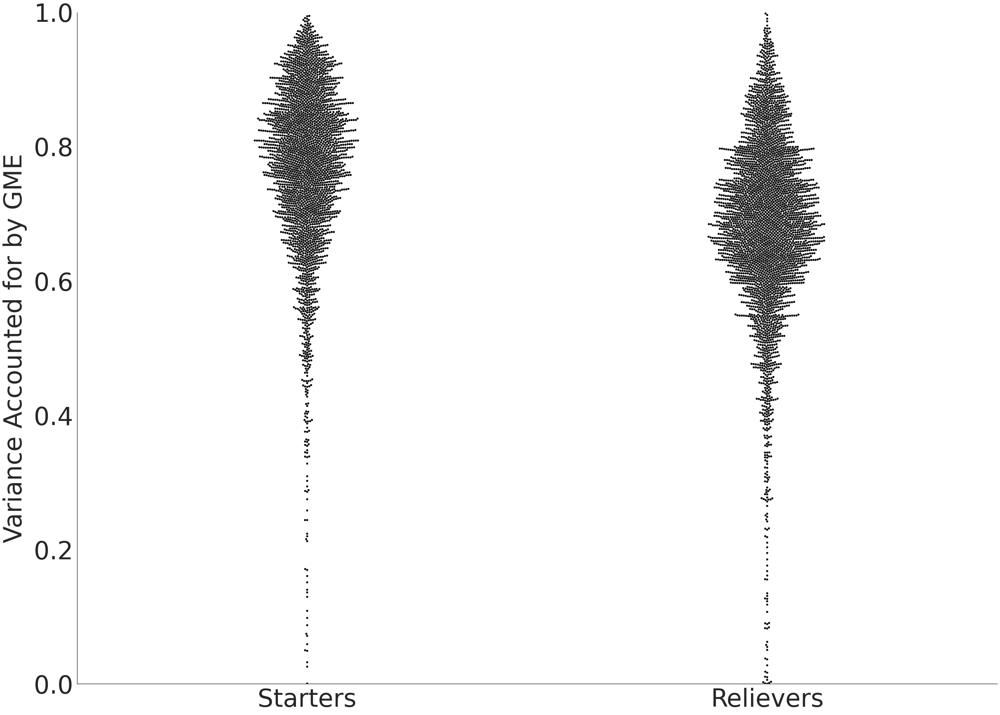

No handles with labels found to put in legend.


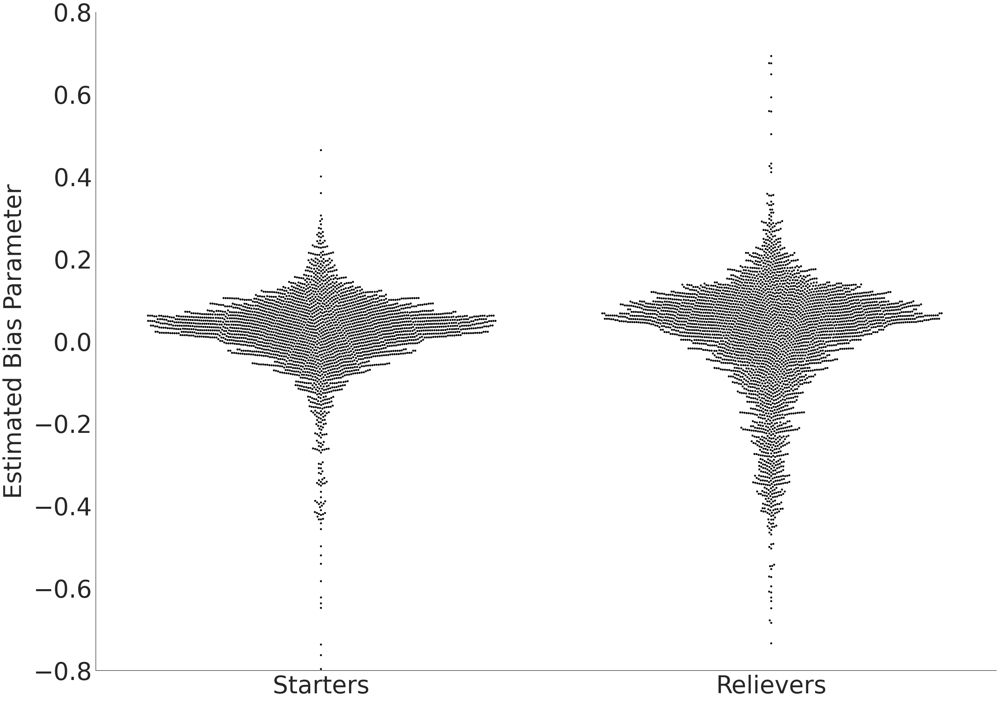

No handles with labels found to put in legend.


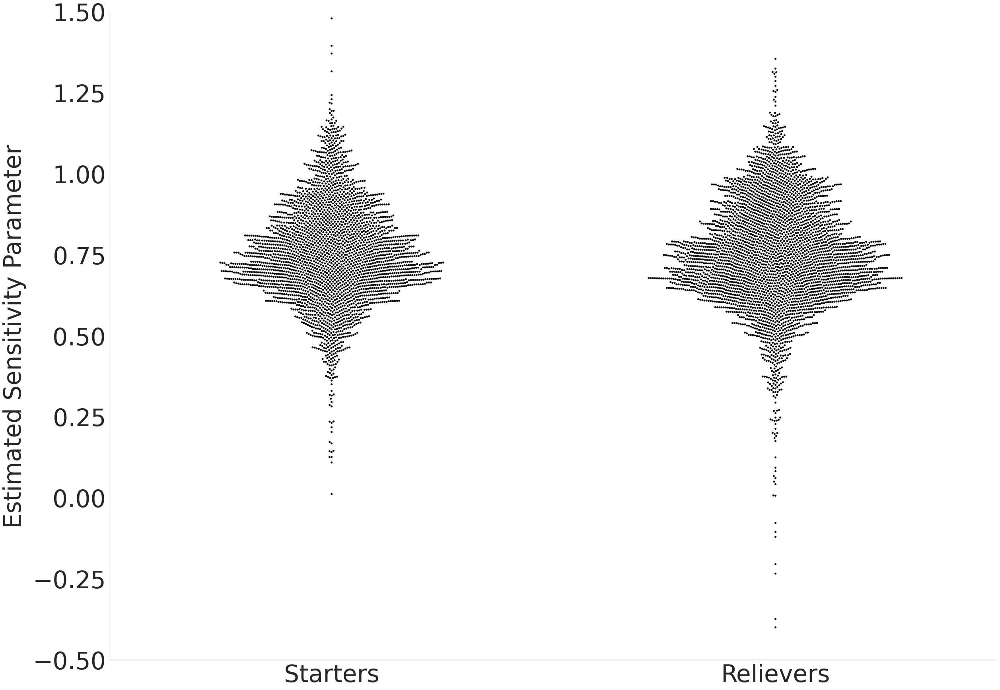

In [ ]:
season_swarm_start_rel(x_val='starter_reliever', y_val='VAC', color='black', y_label='Variance Accounted for by GME', y_min=0, y_max=1, fig_size=(40,30))
season_swarm_start_rel(x_val='starter_reliever', y_val='Bias', color='black', y_label='Estimated Bias Parameter', y_min=-0.8, y_max=0.8, fig_size=(40, 30))
season_swarm_start_rel(x_val='starter_reliever', y_val='Sensitivity', color='black', y_label='Estimated Sensitivity Parameter', y_min=-0.5, y_max=1.5, fig_size=(40, 30))

In [41]:
# Calculate the slope of change in sensitivity and bias across seasons
from scipy import stats
uniq_p = player_fits['Player'].unique()
bias_slope = []
sensitivity_slope = []
player = []

for i in uniq_p:
  player_df = player_fits[player_fits['Player']==i]
  if len(player_df) >=5:
    b_slope = stats.linregress(player_df['Season'], player_df['Bias'])
    s_slope = stats.linregress(player_df['Season'], player_df['Sensitivity'])
    bias_slope.append(b_slope[0])
    sensitivity_slope.append(s_slope[0])
    player.append(i)
  else:
    continue

# Combine into a single df
param_slopes = pd.DataFrame(list(zip(player, bias_slope, sensitivity_slope)), columns=['player', 'bias', 'sensitivity'])
param_slopes = param_slopes.dropna().reset_index()
param_slopes = param_slopes.drop(['index'], axis=1)

In [42]:
# Return the min and max bias and sensitivities 
min_bias = param_slopes[param_slopes['bias']==param_slopes['bias'].min()]
max_bias = param_slopes[param_slopes['bias']==param_slopes['bias'].max()]
min_sens = param_slopes[param_slopes['sensitivity']==param_slopes['sensitivity'].min()]
max_sens = param_slopes[param_slopes['sensitivity']==param_slopes['sensitivity'].max()]

# Print them
print('Min bias:', min_bias, "\n")
print('Max bias:', max_bias, "\n")
print('Min sens:', min_sens, "\n")
print('Max sens:', max_sens, "\n")

Min bias:               player     bias  sensitivity
79  Kendall Graveman -0.14738     -0.18494 

Max bias:            player     bias  sensitivity
75  Freddy Garcia  0.21207      0.16396 

Min sens:               player     bias  sensitivity
79  Kendall Graveman -0.14738     -0.18494 

Max sens:            player     bias  sensitivity
75  Freddy Garcia  0.21207      0.16396 



In [48]:
sort_min = param_slopes.sort_values(by=['bias', 'sensitivity'], ascending=True)
sort_min[::20]

,player,bias,sensitivity
79,Kendall Graveman,-0.147380,-0.184940
407,Josh Osich,-0.033070,0.026900
128,Brian Wilson,-0.024357,0.045837
413,Matt Andriese,-0.020110,0.001360
419,Addison Reed,-0.017375,0.038261
81,Aaron Sanchez,-0.014166,-0.001217
9,Craig Stammen,-0.012176,0.042271
474,Zack Wheeler,-0.010864,0.010828
453,Hansel Robles,-0.008720,0.014170
136,Josh Beckett,-0.007960,0.028183


In [49]:
# Isolate these dfs
freddy_df = player_fits[player_fits['Player']=='Alex Wood']
kendall_df = player_fits[player_fits['Player']=='Andrew Heaney']
arroyo_df = player_fits[player_fits['Player']=='Josh Beckett']
print(freddy_df)
print(kendall_df)
print(arroyo_df)

         Player  Season     VAC  ...  SBrk_Z_Diff  HBrk_T_Diff  SBrk_T_Diff
1863  Alex Wood    2013  0.8110  ...       0.2220      -0.0197      -0.2698
1864  Alex Wood    2014  0.9122  ...      -0.4255      -0.2894      -0.4268
1865  Alex Wood    2015  0.9638  ...      -0.4050      -0.6099      -0.1172
1866  Alex Wood    2016  0.9739  ...      -0.2744      -0.6987       0.0129
1867  Alex Wood    2017  0.9789  ...      -0.1744      -0.7658       0.1070
1868  Alex Wood    2018  0.9798  ...      -0.0689      -0.7961       0.1968
1869  Alex Wood    2019  0.9803  ...      -0.0649      -0.8010       0.2007

[7 rows x 24 columns]
             Player  Season     VAC  ...  SBrk_Z_Diff  HBrk_T_Diff  SBrk_T_Diff
3961  Andrew Heaney    2014  0.9596  ...          NaN      -0.0465          NaN
3962  Andrew Heaney    2015  0.9270  ...          NaN       0.0307          NaN
3963  Andrew Heaney    2017  0.9265  ...       0.0747       0.2124      -0.3459
3964  Andrew Heaney    2018  0.9123  ...       0.

In [56]:
def season_track(y_val, y_label, y_min=None, y_max=None, fig_size=(15, 12), padding=12):
  # Plot it
  f, ax = plt.subplots(figsize=fig_size)
  sns.boxplot(x="Season", y=y_val, data=player_fits, color='white')
  sns.swarmplot(x="Season", y=y_val, data=freddy_df, color='red', size=16, label='Player 1')
  sns.swarmplot(x="Season", y=y_val, data=kendall_df, color='blue', size=16, label='Player 2')
  sns.swarmplot(x="Season", y=y_val, data=arroyo_df, color='green', size=16, label='Player 3')
  plt.xticks(ticks=[0, 1, 2, 3, 4, 5], labels=['1', '2', '3', '4', '5', '6'], fontsize=30)
  ax.tick_params(axis='x', which='major', pad=padding)
  plt.ylim(y_min, y_max)
  plt.yticks(fontsize=30)
  plt.xlabel("MLB Season", fontsize=50, labelpad=(20))
  plt.ylabel(y_label, fontsize=50, labelpad=(20))
  # plt.legend(fontsize=20, frameon=False, bbox_to_anchor=(0.975, 1), loc='upper left', ncol=5)
  right_side = ax.spines["right"]
  right_side.set_visible(False)
  top = ax.spines["top"]
  top.set_visible(False)
  plt.show()

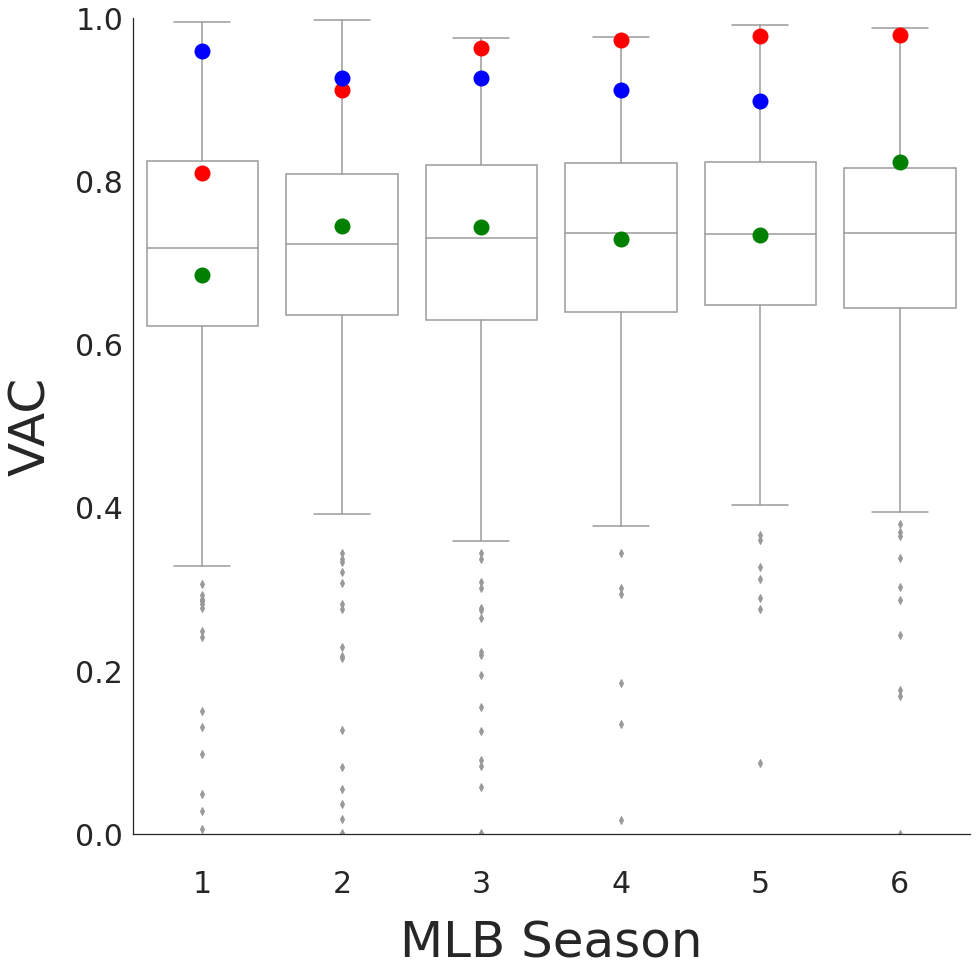

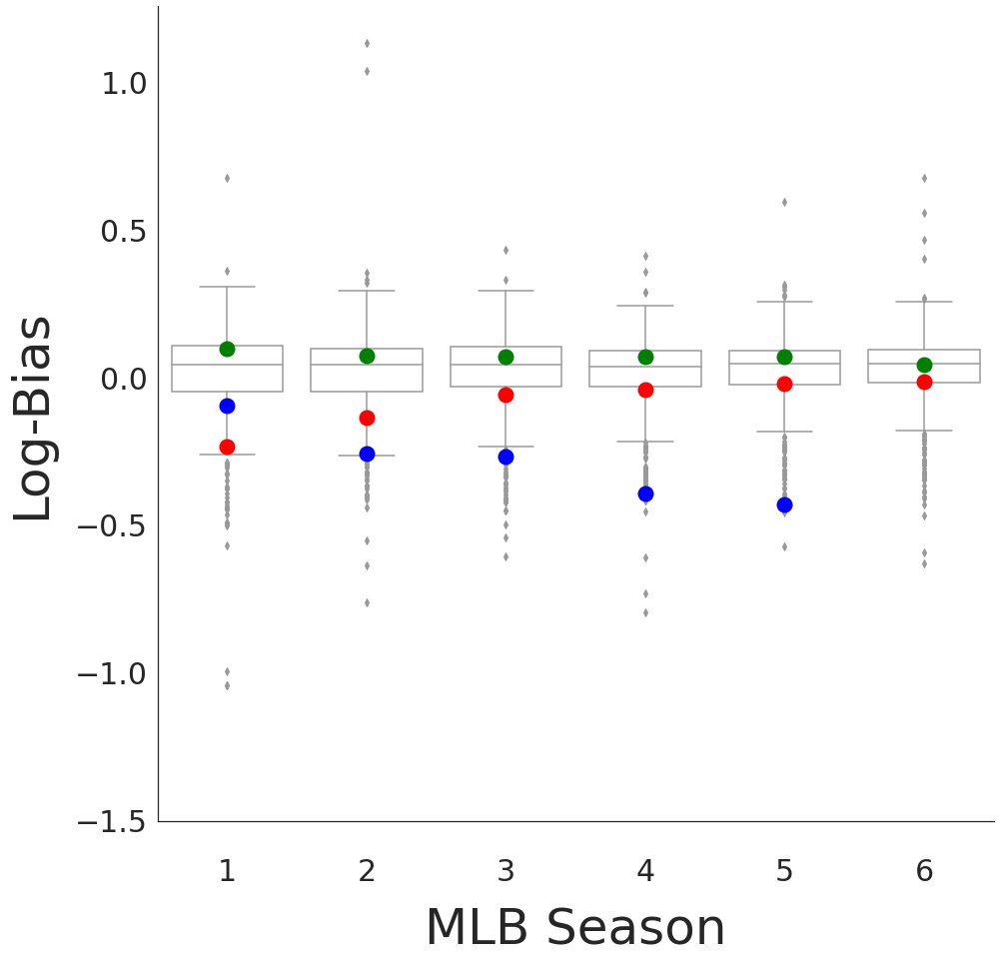

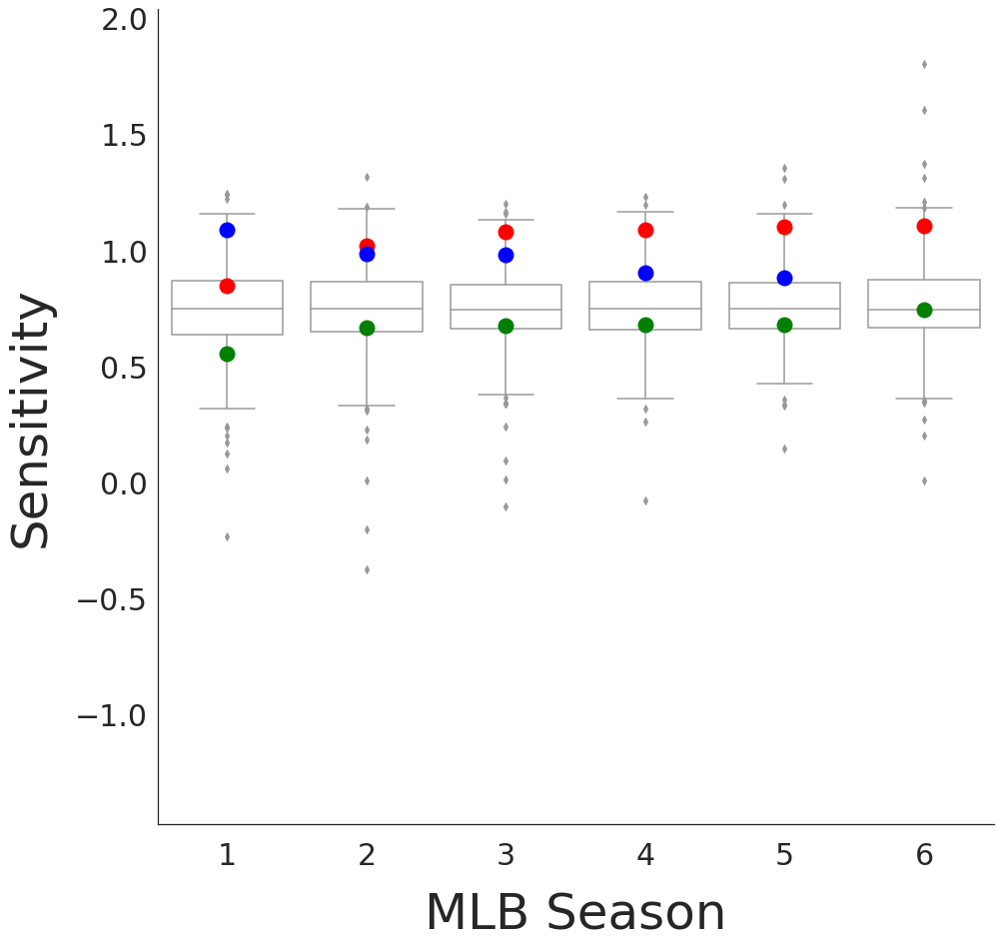

In [57]:
season_track(y_val='VAC', y_label='VAC', y_min=0, y_max=1, fig_size=(15,15), padding=30)
season_track(y_val='Bias', y_label='Log-Bias', fig_size=(15, 15), padding=30)
season_track(y_val='Sensitivity', y_label='Sensitivity',fig_size=(15, 15))